# Idiom Clip Finetuning Notebook
This work presents a multitask learning framework for idiom understanding that leverages both image-text alignment and advanced regularization strategies. By combining idiomatic disambiguation where models distinguish literal from figurative language with auxiliary COCO-style image-text retrieval, our approach evaluates how visual context, span-to-span alignment, and various loss components affect the ability of Mobile Clip Model to disambiguate between Literal and Figurative Potentially Idiomatic Expressions.

Through systematic ablation studies, we quantify the contribution of each component to both idiom classification and retrieval capabilities. Our findings highlight the importance of multimodal information and joint learning objectives for robust, generalizable language understanding models, with practical insights for designing future multimodal NLP systems.

## Install MobileClip

In [3]:
# Install core dependencies and bypass torchvision strictness
!pip install uv -q
!uv pip install torch torchvision huggingface-hub Pillow numpy matplotlib sympy timm open-clip-torch pytorch_lightning peft -q
# MobileCLIP without dependency conflicts
!uv pip install git+https://github.com/apple/ml-mobileclip.git --no-deps -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.5/19.5 MB 96.8 MB/s eta 0:00:00


## Clone MagPie Dataset

In [4]:
!git clone https://huggingface.co/datasets/gsarti/magpie

Cloning into 'magpie'...
remote: Enumerating objects: 58, done.
remote: Total 58 (delta 0), reused 0 (delta 0), pack-reused 58 (from 1)
Unpacking objects: 100% (58/58), 40.19 KiB | 1.67 MiB/s, done.


## Imports

In [1]:
# Standard library imports
import ast
import io
from io import BytesIO
import copy
import random

# Third-party imports
from huggingface_hub import hf_hub_download
from peft import get_peft_model, LoraConfig, TaskType
from PIL import Image
import mobileclip
import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt

from torchmetrics.classification import MulticlassAccuracy
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, Dataset
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint


/usr/local/lib/python3.12/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


In [3]:
import transformers

In [4]:
print("PyTorch version:", torch.__version__)
print("PyTorch Lightning version:", pl.__version__)
print("Transformers version:", transformers.__version__)

PyTorch version: 2.8.0+cu126
PyTorch Lightning version: 2.5.3
Transformers version: 4.55.2


## Seed Everything For Reproduciblity

In [4]:
pl.seed_everything(42, workers=True)

INFO:lightning_fabric.utilities.seed:Seed set to 42


42

## Utility Functions

These functions prepare text data for NLP models by selecting the optimal device, converting sentences into token IDs, and mapping magpie word-level masks to mobileclip token-level masks, making it easier to train or evaluate models. Additionally, add these processed fields to a pandas DataFrame and ensure any image data is in bytes format.


| Function                   | What it does                                               |
|----------------------------|---------------------------------------------------------------------------|
| `get_best_device()`        | Chooses the best hardware (GPU, Apple MPS, or CPU) for running ML code.   |
| `get_ids()`                | Turns a sentence into a list of numbers (“tokens”) using a tokenizer.     |
| `word_to_token_mask()`     | Converts a mask on words to a mask on tokens after splitting by tokenizer.|
| `precompute_token_fields()`| Adds tokenized text & token masks to a table (pandas DataFrame).          |
| `get_img_bytes()`          | Makes sure input is in “bytes” format, even if it was stored as a string. |


In [5]:
def get_best_device():
    """
    Selects the best available torch device (GPU, MPS, TPU, or CPU).

    Returns:
        torch.device: The best available device for computation.
    """
    if torch.cuda.is_available():
        return torch.device("cuda")  # Use CUDA GPU if available
    elif torch.backends.mps.is_available():
        return torch.device("mps")  # Use Apple's Metal Performance Shaders (MPS) if available
    else:
        return torch.device("cpu")  # Default to CPU if no accelerator found


def get_ids(tokenizer, text, add_special_tokens=True):
    """
    Tokenizes input text and returns the token IDs as a list.

    Args:
        tokenizer: The tokenizer object.
        text (str): Text to tokenize.
        add_special_tokens (bool): Whether to add special tokens (e.g., [CLS], [SEP]).

    Returns:
        List[int]: Token IDs for the given text.
    """
    out = tokenizer(text, return_tensors="pt", add_special_tokens=add_special_tokens)
    ids = out["input_ids"] if isinstance(out, dict) else out  # Handle different tokenizer outputs
    if ids.dim() == 2:
        ids = ids[0]  # Remove batch dimension if present
    return ids.tolist()


def word_to_token_mask(tokenizer, special_ids, sentence, word_mask):
    """
    Maps a word-level mask to the corresponding token-level mask after tokenization.

    Args:
        tokenizer: The tokenizer object.
        special_ids (list): IDs to ignore (e.g., special tokens).
        sentence (str): Input sentence.
        word_mask (list[int]): Mask at the word level (e.g., [0,1,0,...]).

    Returns:
        List[int]: Token-level mask aligned with tokenized sentence.
    """
    words = sentence.split()
    if len(words) != len(word_mask):
        raise ValueError(f"{len(words)} words vs {len(word_mask)} mask entries")

    # Tokenize each word, ignoring special tokens
    word_tok_ids = []
    for w in words:
        ids = get_ids(tokenizer, w, add_special_tokens=False)
        ids = [i for i in ids if i not in special_ids]
        word_tok_ids.append(ids)

    # Tokenize full sentence, ignore special tokens for alignment
    all_ids = get_ids(tokenizer, sentence, add_special_tokens=True)
    no_sp_ids = [i for i in all_ids if i not in special_ids]

    token_mask = []
    # Expand word-level mask to token-level (1 per token)
    for wm, toks in zip(word_mask, word_tok_ids):
        token_mask += [wm] * len(toks)

    # If mask is longer than tokens, crop to center around the idiom span
    if len(token_mask) > len(no_sp_ids):
        ann_idxs = [i for i, v in enumerate(token_mask) if v == 1]
        if ann_idxs:
            span_start, span_end = ann_idxs[0], ann_idxs[-1] + 1
            mid = (span_start + span_end) // 2
            win_left = max(0, min(len(token_mask) - len(no_sp_ids), mid - len(no_sp_ids) // 2))
            win_right = win_left + len(no_sp_ids)
            token_mask = token_mask[win_left:win_right]
        else:
            token_mask = token_mask[-len(no_sp_ids):]
    # If mask is shorter than tokens, pad with zeros
    elif len(token_mask) < len(no_sp_ids):
        pad = len(no_sp_ids) - len(token_mask)
        token_mask = token_mask + [0] * pad

    # Final alignment check
    if len(token_mask) != len(no_sp_ids):
        raise ValueError("Token mask and no_sp_ids misaligned after autofix")

    return token_mask


def precompute_token_fields(df, tokenizer, special_ids):
    """
    Adds token IDs and token-level span masks to a DataFrame.

    Args:
        df (pd.DataFrame): Input DataFrame with 'sentence' and 'annotation' (the span mask) columns.
        tokenizer: The tokenizer object.
        special_ids (list): IDs to ignore (e.g., special tokens).

    Returns:
        pd.DataFrame: DataFrame with new 'token_ids' and 'span_token_mask' columns.
    """
    df = df.copy()  # Avoid modifying original DataFrame

    # Add token IDs for each sentence
    df["token_ids"] = df["sentence"].apply(
        lambda s: get_ids(tokenizer, s, add_special_tokens=True)
    )

    # Add token-level masks for each sentence
    df["span_token_mask"] = [
        word_to_token_mask(tokenizer, special_ids, s, [int(x) for x in ann.split()])
        for s, ann in zip(df["sentence"], df["annotation"])
    ]
    return df

def get_img_bytes(x):
    """
    Convert x to bytes if needed.

    Args:
        x: bytes or str

    Returns:
        bytes
    """
    if isinstance(x, bytes):
        return x
    return ast.literal_eval(x)


## Lightning Data Module
The IdiomDataModule organizes and prepares datasets for multimodal idiom and image/text classification or retrieval tasks using PyTorch Lightning, handling all data loading, preprocessing, embedding, and batching. It supports both idiom annotation/image data and standard COCO image-caption datasets, making training and validation seamless for NLP and computer vision models.

| Function/Class/Property                | What it does                                                       |
|----------------------------------------|-----------------------------------------------------------------------------------|
| `IdiomDataModule`                      | Organizes idiom and COCO image/text datasets for deep learning tasks.             |
| `prepare_data()`                       | (Not used here) Placeholder for data download logic.                              |
| `get_img_bytes()`                      | Converts image data to bytes, if stored as a string.                              |
| `setup()`                              | Loads, filters, precomputes, and splits data into train/validation sets.          |
| `IdiomSpanDataset`                     | Dataset class for idiom span classification (sentence, mask, usage, idiom).       |
| `COCORetrievalDataset`                 | Dataset class for image/text retrieval with COCO data.                            |
| `collate_fn()`                         | Collate function for batching idiom span data for model input.                    |
| `coco_collate_fn()`                    | Collate function for batching and padding image/text retrieval data.              |
| `idiom_train_dataloader()`             | Returns DataLoader for idiom span classification training set.                    |
| `idiom_val_dataloader()`               | Returns DataLoader for idiom span classification validation set.                  |
| `coco_train_dataloader()`              | Returns DataLoader for COCO image/text retrieval training set.                    |
| `coco_val_dataloader()`                | Returns DataLoader for COCO image/text retrieval validation set.                  |
| `idiom2img_embedding` (property)       | Returns dictionary mapping idioms to their image embeddings.                      |
| `train_dataframe` (property)           | Returns the training DataFrame for idiom data.                                    |
| `test_dataframe` (property)            | Returns the validation DataFrame for idiom data.                                  |
| `coco_train_sample` (property)         | Returns training split (images, captions) for COCO data.                          |
| `coco_val_sample` (property)           | Returns validation split (images, captions) for COCO data.                        |


In [6]:
class IdiomDataModule(pl.LightningDataModule):
    """
    PyTorch Lightning DataModule for idiom image/text classification and retrieval tasks.
    Handles idiom image/annotation data, COCO image-caption data, preprocessing, and data loading.

    Args:
        idiom_image_path (str): Path to idiom image parquet file.
        magpie_path (str): Path to Magpie idiom annotation TSV.
        coco_parquet_path (str): Path to COCO image-caption parquet file.
        image_encoder: Image encoder model.
        preprocess: Image preprocessing function.
        tokenizer: Text tokenizer.
        batch_size (int): DataLoader batch size.
        num_workers (int): Number of DataLoader workers.
        special_ids (set): Special token IDs to ignore in masks.
    """

    def __init__(
        self,
        idiom_image_path: str,
        magpie_path: str,
        coco_parquet_path: str,
        image_encoder,
        preprocess,
        tokenizer,
        batch_size: int = 16,
        num_workers: int = 2,
        special_ids={0, 49406, 49407}
    ):
        super().__init__()
        self.idiom_image_path = idiom_image_path
        self.magpie_path = magpie_path
        self.coco_parquet_path = coco_parquet_path
        self.batch_size = batch_size
        self.num_workers = num_workers
        self.image_encoder = image_encoder.eval()  # Set encoder to eval mode
        self.preprocess = preprocess
        self.tokenizer = tokenizer
        self.SPECIAL_IDS = special_ids

    def prepare_data(self):
        """
        Lightning hook to download data, if needed.
        Not used here as data should be pre-downloaded.
        """
        pass

    def get_img_bytes(self, x):
        """
        Convert string representation of bytes to bytes if necessary.

        Args:
            x (bytes or str): Image bytes or their string representation.

        Returns:
            bytes: Raw image bytes.
        """
        if isinstance(x, bytes):
            return x
        return ast.literal_eval(x)  # Convert string to bytes

    def setup(self, stage=None):
        """
        Loads, filters, and precomputes idiom/COCO data and embeddings.

        Args:
            stage (str, optional): Stage to set up ("fit", "validate", etc.)
        """
        # --- Load idiom data ---
        idiom_df = pd.read_parquet(self.idiom_image_path)
        mp_df = pd.read_csv(self.magpie_path, delimiter='\t')
        idioms_with_images = set(row['Idiom'].lower() for _, row in idiom_df.iterrows())

        # Filter Magpie data to idioms with images
        filtered_mp_df = mp_df[mp_df['idiom'].str.lower().isin(idioms_with_images)].copy()

        # Build idiom -> {literal, figurative} image bytes mapping
        self.idiom2img = {
            row['Idiom'].lower(): {
                'literal_img_bytes': self.get_img_bytes(row['Literal Image']),
                'figurative_img_bytes': self.get_img_bytes(row['Figurative Image']),
            }
            for _, row in idiom_df.iterrows()
        }

        # --- Precompute image embeddings ---
        device = get_best_device()
        self.image_encoder.to(device)
        self.idiom2img_emb = {}
        for idiom, imgs in self.idiom2img.items():
            self.idiom2img_emb[idiom] = {}
            for key in ["literal_img_bytes", "figurative_img_bytes"]:
                img_bytes = imgs[key]
                pil_img = Image.open(BytesIO(img_bytes)).convert("RGB")
                img_tensor = self.preprocess(pil_img).unsqueeze(0).to(device)
                with torch.no_grad():
                    emb = self.image_encoder.encode_image(img_tensor)
                    emb = emb / emb.norm(dim=-1, keepdim=True)  # Normalize embeddings
                self.idiom2img_emb[idiom][key] = emb.squeeze(0).cpu()  # Store on CPU to save GPU mem

        # --- Precompute token_ids and span_token_mask for idioms ---
        merged_rows = []
        for _, row in filtered_mp_df.iterrows():
            merged_rows.append({
                'sentence': row['sentence'],
                'annotation': row['annotation'],
                'usage': row['usage'],
                'idiom': row['idiom'].lower(),
            })
        merged_df = pd.DataFrame(merged_rows)
        merged_df = precompute_token_fields(merged_df, self.tokenizer, self.SPECIAL_IDS)

        # Split idiom data into train/val
        train_df, test_df = train_test_split(
            merged_df, test_size=0.2, stratify=merged_df['usage'], random_state=42
        )
        self.train_df = train_df.reset_index(drop=True)
        self.test_df = test_df.reset_index(drop=True)

        # --- COCO image/text retrieval data ---
        coco_df = pd.read_parquet(self.coco_parquet_path)
        # For reproducibility: sample 500 for validation, rest 500 for training
        coco_val = coco_df.sample(n=500, random_state=42)
        coco_train = coco_df.drop(coco_val.index)

        self.coco_val = (
            [Image.open(BytesIO(x['bytes'])).convert("RGB") for x in coco_val['image']],
            coco_val['text'].tolist()
        )
        self.coco_train = (
            [Image.open(BytesIO(x['bytes'])).convert("RGB") for x in coco_train['image']],
            coco_train['text'].tolist()
        )

    class IdiomSpanDataset(Dataset):
        """
        Dataset for idiom span classification (sentence, mask, etc.).
        """
        def __init__(self, df, idiom2img):
            self.df = df
            self.idiom2img = idiom2img

        def __len__(self):
            return len(self.df)

        def __getitem__(self, idx):
            """
            Returns a dict containing:
                - sentence: The sentence text.
                - token_ids: Token IDs for the sentence.
                - span_token_mask: Mask over tokens.
                - usage: Label ("literal" or "figurative").
                - idiom: Idiom text.
            """
            row = self.df.iloc[idx]
            return {
                "sentence": row["sentence"],
                "token_ids": row["token_ids"],
                "span_token_mask": row["span_token_mask"],
                "usage": row["usage"],
                "idiom": row["idiom"]
            }

    class COCORetrievalDataset(Dataset):
        """
        Dataset for COCO-style image/text retrieval tasks.
        """
        def __init__(self, images, captions, preprocess, tokenizer):
            self.images = images
            self.captions = captions
            self.preprocess = preprocess
            self.tokenizer = tokenizer

        def __len__(self):
            return len(self.images)

        def __getitem__(self, idx):
            """
            Returns a dict containing:
                - image: Preprocessed image tensor.
                - caption: Token IDs for the caption.
            """
            image = self.preprocess(self.images[idx])
            tokens = self.tokenizer(self.captions[idx], return_tensors="pt", add_special_tokens=True)
            if isinstance(tokens, dict):
                caption = tokens["input_ids"].squeeze(0)
            else:
                caption = tokens.squeeze(0)
            return {"image": image, "caption": caption}

    @staticmethod
    def collate_fn(batch):
        """
        Collate function for idiom span dataloader.
        Batches data into lists/tensors for model input.
        """
        return {
            "sentences": [x["sentence"] for x in batch],
            "token_ids": [x["token_ids"] for x in batch],
            "span_token_masks": [x["span_token_mask"] for x in batch],
            "usages": [0 if x["usage"] == "literal" else 1 for x in batch],  # Convert to binary label
            "idioms": [x["idiom"] for x in batch]
        }

    @staticmethod
    def coco_collate_fn(batch):
        """
        Collate function for COCO retrieval dataloader.
        Pads captions to max length in batch.
        """
        images = torch.stack([x["image"] for x in batch])
        captions = [x["caption"] for x in batch]
        max_len = max([c.shape[0] for c in captions])
        padded = torch.zeros(len(captions), max_len, dtype=torch.long)
        for i, c in enumerate(captions):
            padded[i, :c.shape[0]] = c  # Left pad with zeros
        return {"images": images, "captions": padded}

    def idiom_train_dataloader(self):
        """
        Returns DataLoader for idiom span train set.
        """
        return DataLoader(
            self.IdiomSpanDataset(self.train_df, self.idiom2img),
            batch_size=self.batch_size,
            shuffle=True,
            collate_fn=self.collate_fn,
            num_workers=self.num_workers,
            pin_memory=True
        )

    def idiom_val_dataloader(self):
        """
        Returns DataLoader for idiom span validation set.
        """
        return DataLoader(
            self.IdiomSpanDataset(self.test_df, self.idiom2img),
            batch_size=self.batch_size,
            shuffle=False,
            collate_fn=self.collate_fn,
            num_workers=self.num_workers,
            pin_memory=True
        )

    def coco_train_dataloader(self):
        """
        Returns DataLoader for COCO retrieval train set.
        """
        images, captions = self.coco_train
        return DataLoader(
            self.COCORetrievalDataset(images, captions, self.preprocess, self.tokenizer),
            batch_size=self.batch_size,
            shuffle=True,
            num_workers=self.num_workers,
            pin_memory=True,
            collate_fn=self.coco_collate_fn
        )

    def coco_val_dataloader(self):
        """
        Returns DataLoader for COCO retrieval validation set.
        """
        images, captions = self.coco_val
        return DataLoader(
            self.COCORetrievalDataset(images, captions, self.preprocess, self.tokenizer),
            batch_size=self.batch_size,
            shuffle=False,
            num_workers=self.num_workers,
            pin_memory=True,
            collate_fn=self.coco_collate_fn
        )

    @property
    def idiom2img_embedding(self):
        """
        Returns dict of idiom to image embeddings.
        """
        return self.idiom2img_emb

    @property
    def train_dataframe(self):
        """
        Returns idiom train DataFrame.
        """
        return self.train_df

    @property
    def test_dataframe(self):
        """
        Returns idiom validation DataFrame.
        """
        return self.test_df

    @property
    def coco_train_sample(self):
        """
        Returns (images, captions) tuple for COCO train split.
        """
        return self.coco_train

    @property
    def coco_val_sample(self):
        """
        Returns (images, captions) tuple for COCO validation split.
        """
        return self.coco_val


## Multi Task Loader
The MultiTaskLoader allows you to iterate over two different PyTorch DataLoaders in parallel, always providing a batch from each at every step. When either DataLoader runs out of data, it automatically restarts, and the overall epoch length matches the shorter DataLoader. It is used to enable joint training over the Idiom Dataset and the COCO train split at the setence level to provide regulization.

| Function/Class     | What it does (plain English)                                                         |
|--------------------|--------------------------------------------------------------------------------------|
| `MultiTaskLoader`  | Iterates over two DataLoaders in parallel, giving a batch from each at every step.   |
| `__init__()`       | Initializes the loader with two DataLoader objects.                                  |
| `__iter__()`       | Prepares and resets both internal iterators for iteration.                           |
| `__next__()`       | Returns the next batch from each loader, restarting them if they run out.            |
| `__len__()`        | Returns the number of batches per epoch, determined by the shorter DataLoader.       |




In [7]:
class MultiTaskLoader:
    """
    Iterates over two DataLoaders in parallel, returning a batch from each at every iteration.
    When either loader runs out, it is restarted from the beginning, so epochs are defined
    by the shorter DataLoader.

    Args:
        loader1 (DataLoader): First DataLoader (e.g., idiom task).
        loader2 (DataLoader): Second DataLoader (e.g., COCO retrieval task).

    Example:
        multitask_loader = MultiTaskLoader(loader1, loader2)
        for batch in multitask_loader:
            idiom_batch = batch["idiom"]
            coco_batch = batch["coco"]
    """

    def __init__(self, loader1, loader2):
        """
        Initialize with two DataLoader objects.
        """
        self.loader1 = loader1
        self.loader2 = loader2
        self.iter1 = None  # Iterator for loader1
        self.iter2 = None  # Iterator for loader2

    def __iter__(self):
        """
        Returns the iterator object (self).
        Resets both internal iterators.
        """
        self.iter1 = iter(self.loader1)
        self.iter2 = iter(self.loader2)
        return self

    def __next__(self):
        """
        Returns the next batch from each loader as a dict.
        If either iterator is exhausted, it is restarted.
        """
        try:
            batch1 = next(self.iter1)  # Get next from loader1
        except StopIteration:
            # Restart loader1 if exhausted
            self.iter1 = iter(self.loader1)
            batch1 = next(self.iter1)
        try:
            batch2 = next(self.iter2)  # Get next from loader2
        except StopIteration:
            # Restart loader2 if exhausted
            self.iter2 = iter(self.loader2)
            batch2 = next(self.iter2)
        return {"idiom": batch1, "coco": batch2}

    def __len__(self):
        """
        Returns the number of batches per epoch.
        The epoch ends when the shorter loader is exhausted.
        """
        return min(len(self.loader1), len(self.loader2))


## Lightning Module

The MobileCLIPIdiomsLightning class defines a PyTorch Lightning module for multitask learning on idiom span classification and image/text retrieval, combining custom losses, knowledge distillation, and detailed evaluation and logging routines. It supports both idiom-to-image matching and COCO-style retrieval, providing methods for training, validation, and command-line baseline evaluation.


Notes on the custom loss terms :

- loss_span_image:
InfoNCE (Information Noise-Contrastive
Estimation), a contrastive learning objective implemented via cross-entropy. The logits are the temperature-scaled cosine similarities between every span and every image in the batch. This is standard in CLIP-style models, but here spans are the idiom spans (not whole sentences).

- loss_pair: hinge ranking loss. enforces margin m,
between positive and negative similarities. directly contrasts the correct vs. opposite image, ensuring a minimal similarity gap.

- loss_span_span_h:
Supervised contrastive loss (hierarchial): Weighted supervised con-trastive (SupCon) objectivespans that share the same usage ("literal" or "figurative") are explicitly pulled together in embedding space, while others are pushed apart. This enforces group clustering (beyond instance discrimination). Produces tight intra-idiom clusters
for the same label (strong pull) while still encouraging broader grouping across idioms for the same label (weak pull), improving discrimination without collapsing all literal or all figurative spans into a single global cluster

- loss_kl:
Knowledge distillation: forces the model's current distribution over image matches to stay close to that of the original (pretrained) model, via KL divergence. This regularizes learning, preventing catastrophic forgetting or overfitting.

- loss_coco:
Only sampled sometimes per batch, to avoid overwhelming the idiom loss. Standard symmetric cross-entropy on image-caption pairs for COCO retrieval (CLIP loss).

| Function/Class/Property            | What it does (plain English)                                                        |
|------------------------------------|-------------------------------------------------------------------------------------|
| `MobileCLIPIdiomsLightning`        | PyTorch LightningModule for idiom and COCO multitask learning with custom losses.   |
| `__init__()`                       | Initializes model, hyperparameters, and sets up distillation from original model.   |
| `get_span_from_token_mask()`       | Gets the mean embedding for selected text tokens in a span.                         |
| `supervised_contrastive_loss_h()`    | Computes a loss that encourages idioms with similar usages to have similar embeddings.           |
| `forward()`                        | Produces span and image embeddings for a batch.                                     |
| `training_step()`                  | Computes all multitask losses and logs them during training.                        |
| `validation_step()`                | Runs idiom span validation, storing predictions and ground truths for metrics.      |
| `on_validation_epoch_end()`        | Aggregates validation results, logs metrics, and computes retrieval recalls.        |
| `configure_optimizers()`           | Sets up AdamW optimizer and cosine annealing scheduler.                             |
| `eval_lit_fig()`                   | Command-line idiom classification evaluation; prints accuracy and F1 scores.        |
| `eval_coco_retrieval()`            | Command-line COCO retrieval evaluation; prints Recall@1 and Recall@5 scores.        |



In [8]:
import pytorch_lightning as pl
import torch
import torch.nn.functional as F
import numpy as np
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
import copy

class MobileCLIPIdiomsLightning(pl.LightningModule):
    """
    PyTorch LightningModule for multi-task learning with idiom span classification and COCO retrieval.

    Implements:
    - Idiom-to-image matching with custom span extraction and contrastive objectives.
    - Optional COCO-style image/text retrieval as auxiliary loss.
    - Evaluation and logging for both tasks.

    Loss terms:
    - Idiom-to-image cross-entropy.
    - Supervised contrastive loss (span-to-span).
    - KL-divergence for knowledge distillation from original model.
    - (Optionally) COCO image-text retrieval loss.
    """

    def __init__(
        self,
        model,
        tokenizer,
        preprocess,
        idiom2img_emb,
        train_df,
        test_df,
        coco_val_sample=None,
        lr=1e-4,
        lmbd_kl=0.1,
        temperature=0.07,
        batch_size=16,
        special_ids={0, 49406, 49407},
        lambda_retrieval=1.0,
        coco_loss_prob=0.1,
        pair_margin=0.2,
        lmbd_pair=2.0,
        lambda_supcon=0.5,
    ):
        """
        Args:
            model: The main MobileCLIP model (text+image encoders).
            tokenizer: Huggingface tokenizer.
            preprocess: Preprocessing transform for images.
            idiom2img_emb: Dict mapping idioms to precomputed literal/figurative image embeddings.
            train_df: Training DataFrame for idioms.
            test_df: Validation DataFrame for idioms.
            coco_val_sample: Optional COCO-style (images, captions) validation data.
            lr: Learning rate.
            lmbd_kl: Weight for KL-divergence distillation loss.
            temperature: Softmax temperature for contrastive losses.
            batch_size: Batch size.
            special_ids: Set of special token ids to ignore.
            lambda_retrieval: Weight for COCO retrieval loss.
            coco_loss_prob: Probability to include COCO loss in a given batch.
            pair_margin: Margin for margin-based contrastive loss.
            lmbd_pair: Weight for margin-based contrastive loss.
            lambda_supcon: Weight for supervised contrastive loss.
        """
        super().__init__()
        self.save_hyperparameters(ignore=['model', 'tokenizer', 'preprocess', 'idiom2img_emb', 'train_df', 'test_df', 'coco_val_sample'])
        self.model = model
        self.tokenizer = tokenizer
        self.preprocess = preprocess
        self.idiom2img_emb = idiom2img_emb
        self.train_df = train_df
        self.test_df = test_df
        self.coco_val_sample = coco_val_sample
        self.SPECIAL_IDS = special_ids

        # Best metrics for validation set (updated only during validation)
        self.best_f1_literal = 0.0
        self.best_f1_figurative = 0.0
        self.best_idiom_acc = 0.0
        self.best_idiom_f1 = 0.0
        self.best_coco_i2t_1 = 0.0
        self.best_coco_i2t_5 = 0.0
        self.best_coco_t2i_1 = 0.0
        self.best_coco_t2i_5 = 0.0

        # Accumulate predictions/labels during validation
        self._tmp_val_preds = []
        self._tmp_val_labels = []

        # Keep a frozen copy of the original model for knowledge distillation
        self.model_orig = copy.deepcopy(model)
        self.model_orig.eval()
        for param in self.model_orig.parameters():
            param.requires_grad = False

    def get_span_from_token_mask(self, token_ids, token_mask, model=None):
        """
        Extracts the mean embedding for masked (target) tokens from the text encoder.
        """
        device = next(self.parameters()).device
        if model is None:
            model = self.model
        ids_tensor = torch.tensor(token_ids, device=device).unsqueeze(0)
        te = model.text_encoder
        x = te.embedding_layer(ids_tensor)
        L = x.size(1)
        pos = te.positional_embedding(L)
        x = x + pos
        if hasattr(te, "embedding_dropout"):
            x = te.embedding_dropout(x)
        x = x.transpose(0,1)
        for blk in te.transformer:
            x = blk(x)
        if hasattr(te, "final_layer_norm"):
            x = te.final_layer_norm(x)
        x = x.transpose(0,1)
        flat_embs = x[0]
        keep_idxs = [i for i, tid in enumerate(token_ids) if tid not in self.SPECIAL_IDS]
        embs = flat_embs[keep_idxs]
        if len(embs) != len(token_mask):
            raise ValueError(f"{len(embs)} embeddings vs {len(token_mask)} mask entries")
        picks = [i for i, m in enumerate(token_mask) if m == 1]
        if not picks:
            return embs.mean(dim=0)
        selected = embs[picks]
        return selected.mean(dim=0)

    def supervised_contrastive_loss(self, features, labels, temperature=None):
        """
        Custom supervised contrastive loss.
        Brings features with same label closer together, pushes others apart.
        """
        if temperature is None:
            temperature = self.hparams.temperature
        device = features.device
        features = F.normalize(features, dim=-1)
        batch_size = features.shape[0]
        labels = torch.tensor(labels, device=device)
        mask = torch.eq(labels.unsqueeze(0), labels.unsqueeze(1)).float().to(device)
        contrast = torch.div(torch.matmul(features, features.T), temperature)
        logits_max, _ = torch.max(contrast, dim=1, keepdim=True)
        logits = contrast - logits_max.detach()
        logits_mask = torch.ones_like(mask) - torch.eye(batch_size, device=device)
        mask = mask * logits_mask
        exp_logits = torch.exp(logits) * logits_mask
        log_prob = logits - torch.log(exp_logits.sum(1, keepdim=True) + 1e-9)
        mean_log_prob_pos = (mask * log_prob).sum(1) / (mask.sum(1) + 1e-9)
        loss = -mean_log_prob_pos.mean()
        return loss

    def supcon_hierarchical(self, features, usages, idioms, t=0.07, w_same_idiom=1.0, w_cross_idiom=0.25):
        """
        Hierarchical supervised contrastive loss.
        Strong positives = same usage AND same idiom.
        Weak positives   = same usage BUT different idiom (weighted by w_cross_idiom).
        Negatives        = different usage (only in softmax denominator).

        Args:
            features: [B, D] tensor (can be unnormalized; we normalize inside).
            usages:   list/1D tensor length B with 0/1 (literal/figurative).
            idioms:   list length B (strings or ids).
            t:        temperature.
            w_same_idiom:   weight for positives that share idiom+usage.
            w_cross_idiom:  weight for positives that share usage but different idiom.
        """
        x = F.normalize(features, dim=-1)          # [B, D], cosine space
        B = x.size(0)
        device = x.device
        I = torch.eye(B, device=device)

        usages  = torch.as_tensor(usages, device=device)
        # idioms can be strings; compare in numpy then move to torch
        if isinstance(idioms, torch.Tensor):
            idioms_arr = idioms.cpu().numpy()
        else:
            idioms_arr = np.array(idioms)
        idiomsM = torch.tensor((idioms_arr[:, None] == idioms_arr[None, :]), device=device, dtype=torch.float32)  # [B,B]
        usageM  = (usages[:, None] == usages[None, :]).float()                                                   # [B,B]

        pos_same_idiom  = usageM * idiomsM * (1 - I)             # same usage & same idiom (no self)
        pos_cross_idiom = usageM * (1 - idiomsM) * (1 - I)       # same usage & diff idiom (no self)

        logits  = (x @ x.t()) / t                                # [B,B]
        logits  = logits - logits.max(dim=1, keepdim=True).values.detach()  # stabilizer

        exp     = torch.exp(logits) * (1 - I)                    # zero self
        logprob = logits - torch.log(exp.sum(1, keepdim=True) + 1e-9)  # log softmax over j≠i

        num = (
            w_same_idiom  * (pos_same_idiom  * logprob).sum(1) +
            w_cross_idiom * (pos_cross_idiom * logprob).sum(1)
        )
        den = (
            w_same_idiom  * pos_same_idiom.sum(1) +
            w_cross_idiom * pos_cross_idiom.sum(1) + 1e-9
        )

        loss = -(num / den).mean()

        # ---- Stats (means over anchors) ----
        # how many positives per anchor (same-idiom; cross-idiom)
        pos_same_counts  = pos_same_idiom.sum(1)                 # [B]
        pos_cross_counts = pos_cross_idiom.sum(1)                # [B]

        # average log-prob of positives in each bucket (safe divide)
        same_pos_logprob_mean  = ((pos_same_idiom  * logprob).sum(1)  / (pos_same_counts  + 1e-9)).mean()
        cross_pos_logprob_mean = ((pos_cross_idiom * logprob).sum(1)  / (pos_cross_counts + 1e-9)).mean()

        stats = {
            "pos_same_idiom_mean":  pos_same_counts.mean().detach(),
            "pos_cross_idiom_mean": pos_cross_counts.mean().detach(),
            "same_pos_logprob_mean":  same_pos_logprob_mean.detach(),
            "cross_pos_logprob_mean": cross_pos_logprob_mean.detach(),
        }
        return loss, stats


    def forward(self, batch, model=None):
        """
        Forward pass for idiom span-to-image (and optionally span-to-span) tasks.
        Returns:
            span_embs: [batch, d] idiom span embeddings.
            img_embs: [batch, d] matching image embeddings.
            opposite_embs: [B, D] opposite image embeddings (hard negatives)
        """
        device = next(self.parameters()).device
        if model is None:
            model = self.model
        token_ids_list = batch["token_ids"]
        token_masks_list = batch["span_token_masks"]
        usages = batch["usages"]
        idioms = batch["idioms"]

        # --- spans ---
        span_embs = []
        for token_ids, token_mask in zip(token_ids_list, token_masks_list):
            span_emb = self.get_span_from_token_mask(token_ids, token_mask, model=model)
            span_embs.append(span_emb)
        span_embs = torch.stack(span_embs).to(device)

        # --- images: pos & opposite ---
        #img_embs = []
        pos_list, opp_list = [], []
        for idiom, usage in zip(idioms, usages):
            # key = "literal_img_bytes" if usage == 0 else "figurative_img_bytes"
            # img_emb = self.idiom2img_emb[idiom][key].to(device)
            # img_embs.append(img_emb)

            pos_key = "literal_img_bytes"    if usage == 0 else "figurative_img_bytes"
            opp_key = "figurative_img_bytes" if usage == 0 else "literal_img_bytes"
            pos_list.append(self.idiom2img_emb[idiom][pos_key].to(device))
            opp_list.append(self.idiom2img_emb[idiom][opp_key].to(device))

        # img_embs = torch.stack(img_embs).to(device)
        # return span_embs, img_embs
        img_embs      = torch.stack(pos_list).to(device)
        opposite_embs = torch.stack(opp_list).to(device)
        return span_embs, img_embs, opposite_embs

    def training_step(self, batch, batch_idx):
        """
        Main training step. Handles multitask batches ("idiom" + "coco").
        Computes and logs all loss terms.

        Loss breakdown:
        - Idiom-to-image cross-entropy: forces idiom span and matching image embedding to align.
        - Supervised contrastive loss: encourages spans with same usage ("literal"/"figurative") to cluster.
        - KL-divergence loss: distills predictions from a frozen copy of the initial model (regularizes training).
        - (Optional) COCO retrieval loss: standard symmetric cross-entropy over image-caption pairs.
        """
        # Detect idiom-only batch or multi-task batch
        if "idiom" in batch:
            idiom_batch = batch["idiom"]
            coco_batch = batch.get("coco", None)
        else:
            idiom_batch = batch
            coco_batch = None
        device = next(self.parameters()).device

        # ----- IDIOM LOSSES -----

        span_embs, img_embs, opposite_embs = self.forward(idiom_batch, model=self.model)

        # normalize for cosine space
        span_embs_norm = F.normalize(span_embs, dim=-1)
        img_embs_norm  = F.normalize(img_embs,  dim=-1)
        opposite_embs_norm  = F.normalize(opposite_embs, dim=-1)

        # 1.1 Span-to-image contrastive loss (cross-entropy), CLIP-style CE (span -> image)
        logits = span_embs_norm @ img_embs_norm.T / self.hparams.temperature
        labels = torch.arange(len(span_embs), device=device)
        loss_span_image = F.cross_entropy(logits, labels)

        # 1.2 Pairwise margin(literal vs. figurative images, Hinge-style margin loss: max(0, margin - (s_pos - s_neg)))
        s_pos = (span_embs_norm * img_embs_norm).sum(-1)   # [B]
        s_neg = (span_embs_norm * opposite_embs_norm).sum(-1)      # [B]
        loss_pair = F.relu(self.hparams.pair_margin - (s_pos - s_neg)).mean()

        #2. Supervised contrastive loss (span-to-span)
        loss_span_span_h, supcon_stats = self.supcon_hierarchical(
            features=span_embs,
            usages=idiom_batch["usages"],
            idioms=idiom_batch["idioms"],
            t=self.hparams.temperature,
            w_same_idiom=1.0,
            w_cross_idiom=0.5,
        )

        # 3. KL-divergence loss
        with torch.no_grad():
            sentence_embs = []
            sentence_embs_orig = []
            for token_ids in idiom_batch["token_ids"]:
                ids_tensor = torch.tensor(token_ids, device=device).unsqueeze(0)
                emb = self.model.encode_text(ids_tensor)
                emb = emb / emb.norm(dim=-1, keepdim=True)
                sentence_embs.append(emb.squeeze(0))
                emb_orig = self.model_orig.encode_text(ids_tensor)
                emb_orig = emb_orig / emb_orig.norm(dim=-1, keepdim=True)
                sentence_embs_orig.append(emb_orig.squeeze(0))
            sentence_embs = torch.stack(sentence_embs)
            sentence_embs_orig = torch.stack(sentence_embs_orig)
            sim_logits = sentence_embs @ img_embs_norm.T / self.hparams.temperature
            sim_logits_orig = sentence_embs_orig @ img_embs_norm.T / self.hparams.temperature
        log_probs = F.log_softmax(sim_logits, dim=1)
        probs_orig = F.softmax(sim_logits_orig, dim=1)
        loss_kl = F.kl_div(log_probs, probs_orig, reduction='batchmean')


        loss_idiom = (
            loss_span_image +
            self.hparams.lmbd_kl * loss_kl +
            self.hparams.lmbd_pair      * loss_pair +         #1.2
            self.hparams.lambda_supcon * loss_span_span_h
        )

        # ----- COCO RETRIEVAL LOSS (optional per batch) -----
        lambda_retrieval = self.hparams.lambda_retrieval
        coco_loss_prob = self.hparams.coco_loss_prob
        run_coco = np.random.rand() < coco_loss_prob

        if run_coco:
            images = coco_batch["images"].to(device)
            captions = coco_batch["captions"].to(device)
            img_emb_coco = self.model.encode_image(images)
            txt_emb_coco = self.model.encode_text(captions)
            img_emb_coco = F.normalize(img_emb_coco, dim=-1)
            txt_emb_coco = F.normalize(txt_emb_coco, dim=-1)
            logits_per_image = img_emb_coco @ txt_emb_coco.T / self.hparams.temperature
            targets = torch.arange(len(img_emb_coco), device=device)
            loss_coco = (
                F.cross_entropy(logits_per_image, targets) +
                F.cross_entropy(logits_per_image.T, targets)
            ) / 2
            loss = loss_idiom + lambda_retrieval * loss_coco
            self.log("loss_coco_step", loss_coco, prog_bar=True, on_step=True)
        else:
            loss = loss_idiom
            loss_coco = torch.tensor(0.0, device=device)

        # ----- Logging -----
        self.log("train_loss", loss, on_step=False, on_epoch=True, batch_size=self.hparams.batch_size)
        self.log("loss_step", loss, prog_bar=True, on_step=True)
        self.log("loss_idiom_step", loss_idiom, on_step=True)
        self.log("loss_span_image_step", loss_span_image, on_step=True)
        #self.log("loss_span_span_step", loss_span_span, on_step=True)
        self.log("loss_kl_step", loss_kl, on_step=True)
        self.log("loss_pair_step", loss_pair, on_step=True)
        self.log("loss_supcon_h_step", loss_span_span_h, on_step=True)

        # ----- Diagnostics for the pair loss (after computed gap, mean_gap, frac_viol) -----
        with torch.no_grad():
            gap = (s_pos - s_neg).detach()
            mean_gap  = gap.mean()
            frac_viol = (gap < self.hparams.pair_margin).float().mean()

        # ----- Build a clean log dict -----
        train_logs = {
            "train/pair/gap_mean": mean_gap,
            "train/pair/frac_viol": frac_viol,
            "train/supcon/pos_same_idiom_mean":  supcon_stats["pos_same_idiom_mean"],
            "train/supcon/pos_cross_idiom_mean": supcon_stats["pos_cross_idiom_mean"],
            "train/supcon/same_pos_logprob_mean":  supcon_stats["same_pos_logprob_mean"],
            "train/supcon/cross_pos_logprob_mean": supcon_stats["cross_pos_logprob_mean"],
        }

        # ----- Log everything both step & epoch; pick a couple for the progress bar -----
        # (sync_dist=True is useful if you ever do DDP)
        self.log_dict(
            train_logs,
            on_step=True,
            on_epoch=True,
            batch_size = self.hparams.batch_size,
            prog_bar=False,
        )

        return loss

    def validation_step(self, batch, batch_idx):
        """
        Perform a validation step for one batch during evaluation.

        For each example in the batch, computes the cosine similarity between the
        text span embedding and both the "literal" and "figurative" image embeddings
        corresponding to the idiom. Classifies the example as "literal" if the
        similarity to the literal image is higher, and as "figurative" otherwise.

        The predicted labels and ground truth labels for this batch are appended to
        internal lists for later aggregation and metric calculation.

        Args:
            batch (dict): Dictionary containing batch data with the following keys:
                - "token_ids": tensor of tokenized input ids.
                - "span_token_masks": tensor masks to extract relevant spans.
                - "usages": list or tensor of ground truth labels (0/literal, 1/figurative, or str).
                - "idioms": list of idiom identifiers for image embedding lookup.
            batch_idx (int): Index of the batch in the validation epoch.

        Returns:
            None
        """
        token_ids_batch = batch["token_ids"]
        token_masks_batch = batch["span_token_masks"]
        usages_batch = batch["usages"]
        idioms_batch = batch["idioms"]

        preds = []
        labels = []
        for token_ids, token_mask, usage, idiom in zip(token_ids_batch, token_masks_batch, usages_batch, idioms_batch):
            span_emb = self.get_span_from_token_mask(token_ids, token_mask, model=self.model)
            span_emb = span_emb.unsqueeze(0).to(self.device)
            lit_emb = self.idiom2img_emb[idiom]['literal_img_bytes'].unsqueeze(0).to(self.device)
            fig_emb = self.idiom2img_emb[idiom]['figurative_img_bytes'].unsqueeze(0).to(self.device)
            sim_lit = F.cosine_similarity(span_emb, lit_emb).item()
            sim_fig = F.cosine_similarity(span_emb, fig_emb).item()
            pred = 'literal' if sim_lit > sim_fig else 'figurative'
            # Force both pred and usage to string
            usage_str = 'literal' if usage == 0 or usage == 'literal' else 'figurative'
            preds.append(pred)
            labels.append(usage_str)
        self._tmp_val_preds.extend(preds)
        self._tmp_val_labels.extend(labels)


    def on_validation_epoch_end(self):
        """
        Aggregates predictions for idiom span classification,
        logs F1, accuracy, weighted F1 (val_idiom_f1), and best values.
        Also logs COCO retrieval if available.
        """

        all_preds = self._tmp_val_preds
        all_labels = self._tmp_val_labels
        self._tmp_val_preds = []
        self._tmp_val_labels = []

        if len(all_labels) > 0:
            label_order = ['literal', 'figurative']
            prfs = precision_recall_fscore_support(all_labels, all_preds, average=None, labels=label_order, zero_division=0)
            acc = np.mean(np.array(all_preds) == np.array(all_labels))
            f1_lit, f1_fig = prfs[2][0], prfs[2][1]
            weighted_f1 = precision_recall_fscore_support(all_labels, all_preds, labels=label_order, average='weighted', zero_division=0)[2]
        else:
            f1_lit = f1_fig = acc = weighted_f1 = 0.0

        self.log("val_f1_literal", f1_lit, prog_bar=True)
        self.log("val_f1_figurative", f1_fig, prog_bar=True)
        self.log("val_idiom_accuracy", acc, prog_bar=True)
        self.log("val_idiom_f1", weighted_f1, prog_bar=True)

        if f1_lit > self.best_f1_literal:
            self.best_f1_literal = f1_lit
        if f1_fig > self.best_f1_figurative:
            self.best_f1_figurative = f1_fig
        if acc > self.best_idiom_acc:
            self.best_idiom_acc = acc
        if weighted_f1 > self.best_idiom_f1:
            self.best_idiom_f1 = weighted_f1

        self.log("best_f1_literal", self.best_f1_literal, prog_bar=True)
        self.log("best_f1_figurative", self.best_f1_figurative, prog_bar=True)
        self.log("best_idiom_accuracy", self.best_idiom_acc, prog_bar=True)
        self.log("best_idiom_f1", self.best_idiom_f1, prog_bar=True)  # NEW

        # === COCO metrics ===
        if self.coco_val_sample is not None:
            images, captions = self.coco_val_sample
            device = next(self.parameters()).device
            model = self.model.eval()
            preprocess = self.preprocess
            tokenizer = self.tokenizer

            def encode_images(images, model, preprocess, device, batch=32):
                embs = []
                for i in range(0, len(images), batch):
                    batch_imgs = torch.stack([preprocess(im) for im in images[i:i+batch]]).to(device)
                    with torch.no_grad():
                        feat = model.encode_image(batch_imgs)
                        feat = feat / feat.norm(dim=-1, keepdim=True)
                        embs.append(feat.cpu())
                return torch.cat(embs)
            def encode_captions(captions, model, tokenizer, device, batch=32):
                embs = []
                for i in range(0, len(captions), batch):
                    b = captions[i:i+batch]
                    tokens = tokenizer(b, return_tensors="pt", padding=True, truncation=True)
                    if isinstance(tokens, dict):
                        tokens = tokens["input_ids"]
                    tokens = tokens.to(device)
                    with torch.no_grad():
                        feat = model.encode_text(tokens)
                        feat = feat / feat.norm(dim=-1, keepdim=True)
                        embs.append(feat.cpu())
                return torch.cat(embs)
            def compute_recall_i2t(img_embs, txt_embs, ks=(1,5)):
                sims = img_embs @ txt_embs.T
                ranks = np.argsort(-sims.numpy(), axis=1)
                gt = np.arange(len(img_embs))
                return {k: np.mean([gt[i] in ranks[i,:k] for i in range(len(gt))]) for k in ks}
            def compute_recall_t2i(img_embs, txt_embs, ks=(1,5)):
                sims = img_embs @ txt_embs.T
                ranks = np.argsort(-sims.numpy(), axis=0)
                gt = np.arange(len(txt_embs))
                return {k: np.mean([gt[i] in ranks[:k,i] for i in range(len(gt))]) for k in ks}

            img_embs = encode_images(images, model, preprocess, device, batch=32)
            txt_embs = encode_captions(captions, model, tokenizer, device, batch=32)
            r_i2t = compute_recall_i2t(img_embs, txt_embs)
            r_t2i = compute_recall_t2i(img_embs, txt_embs)

            self.log("val_coco_recall1_i2t", r_i2t[1], prog_bar=True)
            self.log("val_coco_recall5_i2t", r_i2t[5], prog_bar=True)
            self.log("val_coco_recall1_t2i", r_t2i[1], prog_bar=True)
            self.log("val_coco_recall5_t2i", r_t2i[5], prog_bar=True)

            if r_i2t[1] > self.best_coco_i2t_1:
                self.best_coco_i2t_1 = r_i2t[1]
            if r_i2t[5] > self.best_coco_i2t_5:
                self.best_coco_i2t_5 = r_i2t[5]
            if r_t2i[1] > self.best_coco_t2i_1:
                self.best_coco_t2i_1 = r_t2i[1]
            if r_t2i[5] > self.best_coco_t2i_5:
                self.best_coco_t2i_5 = r_t2i[5]

            self.log("best_coco_recall1_i2t", self.best_coco_i2t_1, prog_bar=True)
            self.log("best_coco_recall5_i2t", self.best_coco_i2t_5, prog_bar=True)
            self.log("best_coco_recall1_t2i", self.best_coco_t2i_1, prog_bar=True)
            self.log("best_coco_recall5_t2i", self.best_coco_t2i_5, prog_bar=True)

    def configure_optimizers(self):
        """
        Standard AdamW optimizer and cosine annealing scheduler.
        """
        optimizer = torch.optim.AdamW(self.model.text_encoder.parameters(), lr=self.hparams.lr)
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=5)
        return [optimizer], [scheduler]

    def eval_lit_fig(self):
        """
        CLI Baseline: Literal vs figurative usage classification.
        Prints accuracy and classification report (precision, recall, f1, support) for each class.
        Also prints weighted-average F1.
        """
        device = next(self.parameters()).device
        model = self.model.eval()
        test_df = self.test_df
        idiom2img_emb = self.idiom2img_emb
        all_preds, all_labels = [], []
        for idx, row in test_df.iterrows():
            token_ids = row['token_ids']
            token_mask = row['span_token_mask']
            usage = row['usage']
            idiom = row['idiom']
            try:
                span_emb = self.get_span_from_token_mask(token_ids, token_mask, model=model)
                span_emb = span_emb.unsqueeze(0).to(device)
                lit_emb = idiom2img_emb[idiom]['literal_img_bytes'].unsqueeze(0).to(device)
                fig_emb = idiom2img_emb[idiom]['figurative_img_bytes'].unsqueeze(0).to(device)
                sim_lit = F.cosine_similarity(span_emb, lit_emb).item()
                sim_fig = F.cosine_similarity(span_emb, fig_emb).item()
                pred = 'literal' if sim_lit > sim_fig else 'figurative'
            except Exception as e:
                print(f"Error in row {idx}: {e}")
                pred = "literal"
            all_preds.append(pred)
            all_labels.append(usage)
        acc = accuracy_score(all_labels, all_preds)
        prec, rec, f1, sup = precision_recall_fscore_support(
            all_labels, all_preds, labels=['literal', 'figurative'], zero_division=0
        )
        weighted_f1 = precision_recall_fscore_support(
            all_labels, all_preds, labels=['literal', 'figurative'], average='weighted', zero_division=0
        )[2]
        print("=== Idiom Usage Classification ===")
        print(f"Test accuracy: {acc:.3f}")
        print(f"{'Class':>12} | {'Precision':>9} | {'Recall':>7} | {'F1':>7} | {'Support':>7}")
        print("-" * 44)
        for i, label in enumerate(['literal', 'figurative']):
            print(f"{label:>12} | {prec[i]:9.3f} | {rec[i]:7.3f} | {f1[i]:7.3f} | {sup[i]:7d}")
        print("-" * 40)
        print(f"{'Weighted F1':>12} | {weighted_f1:9.3f}")
        print("-" * 40)

        return {
          "Idiom_Acc": float(acc),
          "F1_Literal": float(f1[0]),
          "F1_Figurative": float(f1[1]),
          "F1_Weighted": float(weighted_f1),
          "Precision_Literal": float(prec[0]),
          "Precision_Figurative": float(prec[1]),
          "Recall_Literal": float(rec[0]),
          "Recall_Figurative": float(rec[1]),
          "Support_Literal": int(sup[0]),
          "Support_Figurative": int(sup[1]),
        }

    def eval_coco_retrieval(self, images, captions, batch=32, return_dicts=False):
        """
        CLI Baseline: COCO image-text retrieval. Prints Recall@1 and Recall@5 for both directions.
        """
        device = next(self.parameters()).device
        model = self.model.eval()
        preprocess = self.preprocess
        tokenizer = self.tokenizer

        def encode_images(images, model, preprocess, device, batch=32):
            embs = []
            for i in range(0, len(images), batch):
                batch_imgs = torch.stack([preprocess(im) for im in images[i:i+batch]]).to(device)
                with torch.no_grad():
                    feat = model.encode_image(batch_imgs)
                    feat = feat / feat.norm(dim=-1, keepdim=True)
                    embs.append(feat.cpu())
            return torch.cat(embs)
        def encode_captions(captions, model, tokenizer, device, batch=32):
            embs = []
            for i in range(0, len(captions), batch):
                b = captions[i:i+batch]
                tokens = tokenizer(b, return_tensors="pt", padding=True, truncation=True)
                if isinstance(tokens, dict):
                    tokens = tokens["input_ids"]
                tokens = tokens.to(device)
                with torch.no_grad():
                    feat = model.encode_text(tokens)
                    feat = feat / feat.norm(dim=-1, keepdim=True)
                    embs.append(feat.cpu())
            return torch.cat(embs)
        def compute_recall_i2t(img_embs, txt_embs, ks=(1,5)):
            sims = img_embs @ txt_embs.T
            ranks = np.argsort(-sims.numpy(), axis=1)
            gt = np.arange(len(img_embs))
            return {k: np.mean([gt[i] in ranks[i,:k] for i in range(len(gt))]) for k in ks}
        def compute_recall_t2i(img_embs, txt_embs, ks=(1,5)):
            sims = img_embs @ txt_embs.T
            ranks = np.argsort(-sims.numpy(), axis=0)
            gt = np.arange(len(txt_embs))
            return {k: np.mean([gt[i] in ranks[:k,i] for i in range(len(gt))]) for k in ks}

        img_embs = encode_images(images, model, preprocess, device, batch)
        txt_embs = encode_captions(captions, model, tokenizer, device, batch)
        r_i2t = compute_recall_i2t(img_embs, txt_embs)
        r_t2i = compute_recall_t2i(img_embs, txt_embs)
        print("=== COCO-style Image-Text Retrieval (Val Split) ===")
        print(f"I2T Recall@1: {r_i2t[1]:.3f}, Recall@5: {r_i2t[5]:.3f}")
        print(f"T2I Recall@1: {r_t2i[1]:.3f}, Recall@5: {r_t2i[5]:.3f}")
        print('-' * 40)
        if return_dicts:
            return r_i2t, r_t2i


## Load Model
This code downloads the pretrained MobileCLIP model checkpoint from HuggingFace Hub and loads the model along with its image preprocessing pipeline. It also loads the appropriate tokenizer needed for preparing text inputs for the model.



In [9]:
# Download the pretrained MobileCLIP checkpoint from HuggingFace Hub
ckpt = hf_hub_download("apple/MobileCLIP-S0", "mobileclip_s0.pt")
# Load the MobileCLIP model, image preprocessing pipeline, and (unused) metadata using the checkpoint
model, _, preprocess = mobileclip.create_model_and_transforms('mobileclip_s0', pretrained=ckpt)
# Load the associated tokenizer for the MobileCLIP model
tokenizer = mobileclip.get_tokenizer('mobileclip_s0')

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


mobileclip_s0.pt:   0%|          | 0.00/216M [00:00<?, ?B/s]

## Load Data

This code sets up file paths for idiom image data, idiom annotations, and COCO image-caption data, then instantiates an IdiomDataModule to handle all data loading and preprocessing. It creates DataLoaders for both idiom and COCO tasks and combines them with a MultiTaskLoader to enable multitask training.



In [10]:
# File path for the idiom images dataset (parquet format)
idiom_image_path = '/content/idiom_images_kws.parquet'

# File path for the Magpie idiom annotations (TSV format)
magpie_path = '/content/magpie/magpie.tsv'

# File path for the COCO image-caption data (parquet format, hosted on HuggingFace)
coco_parquet_path = "hf://datasets/JotDe/mscoco_1k/data/train-00000-of-00001-1c3511b9df1f3a58.parquet"

# Instantiate the Lightning DataModule, which handles all data preprocessing and loading
data_module = IdiomDataModule(
    idiom_image_path=idiom_image_path,   # Idiom images
    magpie_path=magpie_path,             # Idiom annotations
    coco_parquet_path=coco_parquet_path, # COCO image-caption pairs
    image_encoder=model,                 # The loaded MobileCLIP model
    preprocess=preprocess,               # Image preprocessing function
    tokenizer=tokenizer,                 # Text tokenizer
    batch_size=16,                       # Batch size for DataLoaders
    num_workers=2,                       # Number of parallel workers for DataLoaders
)

# Load and preprocess all data, compute embeddings, split datasets, etc.
data_module.setup()

# Create idiom span classification DataLoader (training split)
idiom_loader = data_module.idiom_train_dataloader()

# Create COCO image-caption retrieval DataLoader (training split)
coco_loader = data_module.coco_train_dataloader()

# Create a MultiTaskLoader to iterate over both idiom and COCO DataLoaders in parallel for multitask training
multi_loader = MultiTaskLoader(idiom_loader, coco_loader)

print("Data Loaded")

Data Loaded


## Visualize Idioms
This code visualizes a table of idioms by displaying, for each idiom, its label alongside its corresponding literal and figurative images in a grid layout. It uses matplotlib to arrange these images in rows, where each idiom occupies three columns: the name, literal image, and figurative image.



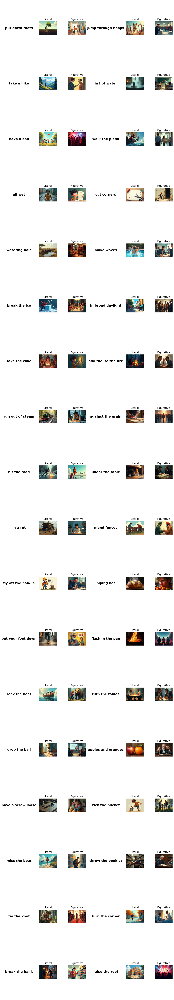

In [ ]:
idioms_per_row = 2
idiom_df = pd.read_parquet(idiom_image_path)
n_idioms = len(idiom_df)
n_rows = (n_idioms + idioms_per_row - 1) // idioms_per_row

fig, axes = plt.subplots(n_rows, idioms_per_row * 3, figsize=(idioms_per_row * 6, n_rows * 3.8))

if n_rows == 1:
    axes = axes.reshape(1, -1)

for idx, (i, row) in enumerate(idiom_df.iterrows()):
    idiom_col = idx % idioms_per_row
    row_idx = idx // idioms_per_row

    base_col = idiom_col * 3

    # Idiom label
    axes[row_idx, base_col].axis('off')
    axes[row_idx, base_col].text(0.5, 0.5, row['Idiom'], fontsize=16, fontweight='bold', ha='center', va='center')

    # Literal image
    img_bytes_lit = get_img_bytes(row['Literal Image'])
    img_lit = Image.open(io.BytesIO(img_bytes_lit))
    axes[row_idx, base_col + 1].imshow(img_lit)
    axes[row_idx, base_col + 1].axis('off')
    axes[row_idx, base_col + 1].set_title("Literal", fontsize=13)

    # Figurative image
    img_bytes_fig = get_img_bytes(row['Figurative Image'])
    img_fig = Image.open(BytesIO(img_bytes_fig))
    axes[row_idx, base_col + 2].imshow(img_fig)
    axes[row_idx, base_col + 2].axis('off')
    axes[row_idx, base_col + 2].set_title("Figurative", fontsize=13)

# Remove unused axes (if any)
for idx in range(n_idioms, n_rows * idioms_per_row):
    idiom_col = idx % idioms_per_row
    row_idx = idx // idioms_per_row
    base_col = idiom_col * 3
    for k in range(3):
        axes[row_idx, base_col + k].axis('off')

plt.tight_layout()
plt.show()


## Visualize MagPie Annotations

This code loads the Magpie idiom annotation dataset from a TSV file into a pandas DataFrame and displays the first few rows. It's a quick way to preview the data structure and contents for exploration or debugging.

In [ ]:
mp_df = pd.read_csv(magpie_path, delimiter='\t')
mp_df.head()

,sentence,annotation,idiom,usage,variant,pos_tags
0,The boy pulled himself together so hastily tha...,0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 ...,a hair's breadth,figurative,misc,DET NOUN VERB PRON ADV ADV ADV ADP ADJ NOUN VE...
1,"Martin Rosenbaum, the family adviser, added : ...",0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 ...,a hair's breadth,figurative,misc,PROPN PROPN DET NOUN NOUN VERB PUNCT PUNCT DET...
2,The cutting edge of his sword was a hair's - b...,0 0 0 0 0 0 0 0 1 0 0 0 0 0,a hair's breadth,figurative,misc,DET VERB NOUN ADP ADJ NOUN VERB DET NOUN PUNCT...
3,"To pipe stars, hold the bag at right angles to...",0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0,a hair's breadth,figurative,misc,PART VERB NOUN VERB DET NOUN ADP ADJ NOUN ADP ...
4,Gallup for The Daily Telegraph gave the Conser...,0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 ...,a hair's breadth,figurative,misc,PROPN ADP DET PROPN PROPN VERB DET PROPN DET N...


## Model Baseline
This code initializes the multitask PyTorch Lightning model for idiom and image-text retrieval tasks using the preprocessed data and model components, then runs and prints baseline evaluations for idiom classification and COCO image-text retrieval on the validation set. The results help assess the model's performance before any training or fine-tuning.



In [ ]:
# Initialize the PyTorch Lightning module for multitask training and evaluation
pl_model = MobileCLIPIdiomsLightning(
    model=model,                                  # MobileCLIP model (image + text encoder)
    tokenizer=tokenizer,                          # Tokenizer for input text
    preprocess=preprocess,                        # Preprocessing for input images
    idiom2img_emb=data_module.idiom2img_embedding, # Dict: idiom to precomputed image embeddings
    train_df=data_module.train_dataframe,         # DataFrame: training split for idiom data
    test_df=data_module.test_dataframe,           # DataFrame: validation split for idiom data
    coco_val_sample=data_module.coco_val_sample,  # (Images, captions) tuple for COCO val set
    lambda_retrieval=1.0,                         # Weight for COCO retrieval loss
    coco_loss_prob=0.1,                           # Probability to add COCO loss each batch
)

# Print baseline evaluation for idiom literal/figurative classification on the validation set
print("Model Baseline:" )
pl_model.eval_lit_fig()

# Print baseline evaluation for COCO image-text retrieval metrics on the validation set
images, captions = data_module.coco_val_sample
pl_model.eval_coco_retrieval(images, captions)

print("-" * 50)

Model Baseline:
=== Idiom Usage Classification ===
Test accuracy: 0.508
       Class | Precision |  Recall |      F1 | Support
--------------------------------------------
     literal |     0.360 |   0.471 |   0.408 |      85
  figurative |     0.640 |   0.530 |   0.580 |     151
----------------------------------------
 Weighted F1 |     0.518
----------------------------------------
=== COCO-style Image-Text Retrieval (Val Split) ===
I2T Recall@1: 0.266, Recall@5: 0.780
T2I Recall@1: 0.230, Recall@5: 0.776
----------------------------------------
--------------------------------------------------


The model shows moderate performance on idiom literal/figurative classification, with overall accuracy (0.508) and weighted F1 (0.518) just above random chance, and better results for figurative idioms than literal ones. For COCO-style image-text retrieval, the model retrieves correct captions or images within the top 5 results over 77% of the time, but single-shot (Recall@1) performance is noticeably lower, suggesting room for improvement in precise matching.









Ask ChatGPT


## Training Full Model
This code sets up a PyTorch Lightning Trainer for multitask model training with checkpointing, profiling, and mixed-precision support, then starts training using the combined idiom and COCO dataloaders. The setup is optimized for efficient training, performance tracking, and automatic device selection (GPU or CPU).

In [ ]:
print("Training:" )

# Initialize a simple profiler to track training time and bottlenecks
profiler = pl.profilers.SimpleProfiler()

# Callback to save model checkpoints
checkpoint_callback = ModelCheckpoint(
    save_top_k=1,                  # Only keep the best checkpoint
    monitor="loss",        # Monitor the idiom f1 to decide which model to save
    mode="min",
    every_n_epochs=1,              # Save a checkpoint every epochs
)

# Configure the PyTorch Lightning Trainer for training
trainer = pl.Trainer(
    max_epochs=10,                       # Train for 10 epochs
    profiler=profiler,                   # Use the simple profiler for performance tracking
    accelerator="auto",                  # Use GPU if available, else fallback to CPU
    devices=1,                           # Number of devices to use (1 GPU or 1 CPU)
    num_sanity_val_steps=0,              # Skip validation sanity checks at start
    log_every_n_steps=50,                # Log metrics every 50 steps
    precision="16-mixed",                # Use mixed precision (FP16) for faster training on supported hardware
    callbacks=[checkpoint_callback],     # List of callbacks (checkpoint saving)
)

# Start model training using the multitask dataloader and validation loader
trainer.fit(
    pl_model,
    train_dataloaders=multi_loader,                      # Multi-task loader for idiom and COCO tasks
    val_dataloaders=data_module.idiom_val_dataloader()   # Validation loader for idiom task
)

# Print profiler summary for insight into training time and performance bottlenecks
# print(profiler.summary())


INFO:pytorch_lightning.utilities.rank_zero:Using 16bit Automatic Mixed Precision (AMP)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Training:


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.12/dist-packages/pytorch_lightning/utilities/model_summary/model_summary.py:231: Precision 16-mixed is not supported by the model summary.  Estimated model size in MB will not be accurate. Using 32 bits instead.
INFO:pytorch_lightning.callbacks.model_summary:
  | Name       | Type          | Params | Mode 
-----------------------------------------------------
0 | model      | CLIP          | 53.8 M | eval 
1 | tokenizer  | ClipTokenizer | 0      | train
2 | model_orig | CLIP          | 53.8 M | eval 
-----------------------------------------------------
53.2 M    Trainable params
54.4 M    Non-trainable params
107 M     Total params
430.337   Total estimated model params size (MB)
1         Modules in train mode
820       Modules in eval mode
/usr/local/lib/python3.12/dist-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (31) is smaller than the logg

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.
INFO:pytorch_lightning.profilers.profiler:FIT Profiler Report

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
|  Action                                                                                                                                                           	|  Mean duration (s)	|  Num calls      	|  Total time (s) 	|  Percentage %   	|
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
|  Total                                                           

We used the TensorBoard logger in PyTorch Lightning to monitor training progress. It provided visualizations of losses, metrics, and learning curves.

In [ ]:
    %load_ext tensorboard
    %tensorboard --logdir /content/lightning_logs

<IPython.core.display.Javascript object>

This code loads the best-performing checkpoint from training and restores it into a MobileCLIPIdiomsLightning model, reinitializing it with the same tokenizer, preprocessing pipeline, and dataset references, before moving it to the appropriate device (CPU/GPU) for evaluation

In [ ]:
best_ckpt = trainer.checkpoint_callback.best_model_path
print("Best ckpt:", best_ckpt)

pl_model_trained = MobileCLIPIdiomsLightning.load_from_checkpoint(
    best_ckpt,
    model=model,                      # same base model object
    tokenizer=tokenizer,
    preprocess=preprocess,
    idiom2img_emb=data_module.idiom2img_embedding,
    train_df=data_module.train_dataframe,
    test_df=data_module.test_dataframe,
    coco_val_sample=data_module.coco_val_sample,
).eval().to("cuda" if torch.cuda.is_available() else "cpu")

Best ckpt: /content/lightning_logs/version_0/checkpoints/epoch=6-step=217.ckpt


In [ ]:
# Print baseline evaluation for idiom literal/figurative classification on the validation set
print("Model Results:" )
pl_model_trained.eval_lit_fig()

# Print baseline evaluation for COCO image-text retrieval metrics on the validation set
images, captions = data_module.coco_val_sample
pl_model_trained.eval_coco_retrieval(images, captions)

print("-" * 50)

Model Results:
=== Idiom Usage Classification ===
Test accuracy: 0.898
       Class | Precision |  Recall |      F1 | Support
--------------------------------------------
     literal |     0.877 |   0.835 |   0.855 |      85
  figurative |     0.910 |   0.934 |   0.922 |     151
----------------------------------------
 Weighted F1 |     0.898
----------------------------------------
=== COCO-style Image-Text Retrieval (Val Split) ===
I2T Recall@1: 0.268, Recall@5: 0.768
T2I Recall@1: 0.256, Recall@5: 0.736
----------------------------------------
--------------------------------------------------


After training, the model achieved high performance on idiom classification, with validation F1 scores of 0.855 (literal), 0.922 (figurative), and overall idiom accuracy of 0.898 showing strong gains over the baseline of 0.508! COCO image-text retrieval metrics remained similar to baseline, with Recall@1 around 0.26 and Recall@5 near 0.75, indicating solid but not exceptional retrieval performance.

# error analysis

In [ ]:
# Download the pretrained MobileCLIP checkpoint from HuggingFace Hub
ckpt = hf_hub_download("apple/MobileCLIP-S0", "mobileclip_s0.pt")
# Load the MobileCLIP model, image preprocessing pipeline, and (unused) metadata using the checkpoint
model, _, preprocess = mobileclip.create_model_and_transforms('mobileclip_s0', pretrained=ckpt)
# Load the associated tokenizer for the MobileCLIP model
tokenizer = mobileclip.get_tokenizer('mobileclip_s0')
# Initialize the PyTorch Lightning module for multitask training and evaluation
baseline = MobileCLIPIdiomsLightning(
    model=model,                                  # MobileCLIP model (image + text encoder)
    tokenizer=tokenizer,                          # Tokenizer for input text
    preprocess=preprocess,                        # Preprocessing for input images
    idiom2img_emb=data_module.idiom2img_embedding, # Dict: idiom to precomputed image embeddings
    train_df=data_module.train_dataframe,         # DataFrame: training split for idiom data
    test_df=data_module.test_dataframe,           # DataFrame: validation split for idiom data
    coco_val_sample=data_module.coco_val_sample,  # (Images, captions) tuple for COCO val set
    lambda_retrieval=1.0,                         # Weight for COCO retrieval loss
    coco_loss_prob=0.1,                           # Probability to add COCO loss each batch
)


# Print baseline evaluation for idiom literal/figurative classification on the validation set
print("Model Baseline:" )
baseline.eval_lit_fig()

# Print baseline evaluation for COCO image-text retrieval metrics on the validation set
images, captions = data_module.coco_val_sample
baseline.eval_coco_retrieval(images, captions)

print("-" * 50)

# Print baseline evaluation for idiom literal/figurative classification on the validation set
print("Model Results:" )
pl_model_trained.eval_lit_fig()

# Print baseline evaluation for COCO image-text retrieval metrics on the validation set
images, captions = data_module.coco_val_sample
pl_model_trained.eval_coco_retrieval(images, captions)

print("-" * 50)


Model Baseline:
=== Idiom Usage Classification ===
Test accuracy: 0.508
       Class | Precision |  Recall |      F1 | Support
--------------------------------------------
     literal |     0.360 |   0.471 |   0.408 |      85
  figurative |     0.640 |   0.530 |   0.580 |     151
----------------------------------------
 Weighted F1 |     0.518
----------------------------------------
=== COCO-style Image-Text Retrieval (Val Split) ===
I2T Recall@1: 0.266, Recall@5: 0.780
T2I Recall@1: 0.226, Recall@5: 0.776
----------------------------------------
--------------------------------------------------
Model Results:
=== Idiom Usage Classification ===
Test accuracy: 0.898
       Class | Precision |  Recall |      F1 | Support
--------------------------------------------
     literal |     0.877 |   0.835 |   0.855 |      85
  figurative |     0.910 |   0.934 |   0.922 |     151
----------------------------------------
 Weighted F1 |     0.898
----------------------------------------
=== C

In [ ]:
# ===== Error Analysis with full sentence text (baseline vs trained + detailed supports) =====
import torch, numpy as np, pandas as pd
import torch.nn.functional as F
from sklearn.metrics import precision_recall_fscore_support, accuracy_score
from IPython.display import display

# -------- 0) Resolve handles --------
try:
    plm = pl_model_trained  # LightningModule
except NameError as e:
    raise RuntimeError("Missing variable: 'pl_model_trained' (trained Lightning module).") from e

try:
    base_model = baseline   # plain torch.nn.Module (pre-train)
except NameError as e:
    raise RuntimeError("Missing variable: 'baseline' (original pre-train model).") from e

plm.eval()

# -------- 1) Device alignment --------
def _first_param_device(m):
    for p in m.parameters():
        return p.device
    return torch.device("cuda" if torch.cuda.is_available() else "cpu")

device = _first_param_device(plm)
plm.model.to(device)
base_model.to(device)

# -------- 2) Helpers --------
def _to_label(x):
    if isinstance(x, str):
        return 'literal' if x.lower().startswith('lit') else 'figurative'
    return 'literal' if int(x) == 0 else 'figurative'

def _decode_span_text(token_ids, span_mask, tokenizer, special_ids):
    non_special_positions = [i for i, tid in enumerate(token_ids) if tid not in special_ids]
    kept_ids = [token_ids[i] for i in non_special_positions]

    if len(kept_ids) != len(span_mask):
        idxs = [i for i, m in enumerate(span_mask) if m == 1]
        ids = [kept_ids[i] for i in idxs if i < len(kept_ids)]
    else:
        ids = [tid for tid, m in zip(kept_ids, span_mask) if m == 1]

    if not ids:
        return ""

    if hasattr(tokenizer, "decode"):
        try:
            return tokenizer.decode(ids, skip_special_tokens=True).strip()
        except Exception:
            pass
    if hasattr(tokenizer, "convert_ids_to_tokens"):
        toks = tokenizer.convert_ids_to_tokens(ids)
        if hasattr(tokenizer, "convert_tokens_to_string"):
            try:
                return tokenizer.convert_tokens_to_string(toks).strip()
            except Exception:
                return " ".join(toks).replace("Ġ", " ").replace("##", "").strip()
        else:
            return " ".join(toks).replace("Ġ", " ").replace("##", "").strip()
    return str(ids)

@torch.no_grad()
def _predict_one_span_vs_imgs(module, token_ids, span_mask, idiom, model_for_span):
    mdl_device = _first_param_device(model_for_span)
    span = module.get_span_from_token_mask(token_ids, span_mask, model=model_for_span).unsqueeze(0).to(mdl_device)
    lit = module.idiom2img_emb[idiom]['literal_img_bytes'].unsqueeze(0).to(mdl_device)
    fig = module.idiom2img_emb[idiom]['figurative_img_bytes'].unsqueeze(0).to(mdl_device)

    s_lit = F.cosine_similarity(span, lit).item()
    s_fig = F.cosine_similarity(span, fig).item()
    pred  = 'literal' if s_lit > s_fig else 'figurative'
    return dict(pred=pred, sim_lit=s_lit, sim_fig=s_fig, margin=abs(s_lit - s_fig))

def _warn_if_identical_weights(trained_model, baseline_model):
    def _named_params(obj):
        if hasattr(obj, "text_encoder"):
            return obj.text_encoder.named_parameters()
        return obj.named_parameters()
    same = True
    try:
        for (_, p1), (_, p2) in zip(_named_params(trained_model), _named_params(baseline_model)):
            if not torch.allclose(p1.detach().float().cpu(), p2.detach().float().cpu(), atol=0, rtol=0):
                same = False
                break
    except Exception:
        same = False
    if same:
        print("Warning: 'baseline' weights appear identical to the trained model's weights.")

# -------- 3) Build unified eval table --------
@torch.no_grad()
def build_eval_table(module, trained_model, baseline_model):
    _warn_if_identical_weights(trained_model, baseline_model)

    rows = []
    df = module.test_df
    tokenizer = module.tokenizer
    special_ids = module.SPECIAL_IDS

    for idx, row in df.iterrows():
        tok = row['token_ids']
        msk = row['span_token_mask']
        idi = row['idiom']
        y   = _to_label(row['usage'])

        post = _predict_one_span_vs_imgs(module, tok, msk, idi, trained_model)
        base = _predict_one_span_vs_imgs(module, tok, msk, idi, baseline_model)
        span_text = _decode_span_text(tok, msk, tokenizer, special_ids)

        rows.append({
            "idx": idx,
            "idiom": idi,
            "sentence": row['sentence'],  # full sentence
            "true": y,
            "pred_post": post["pred"],
            "sim_lit_post": post["sim_lit"],
            "sim_fig_post": post["sim_fig"],
            "margin_post": post["margin"],
            "pred_base": base["pred"],
            "sim_lit_base": base["sim_lit"],
            "sim_fig_base": base["sim_fig"],
            "margin_base": base["margin"],
            "span_text": span_text,
        })

    return pd.DataFrame(rows)

# -------- 4) Tables --------
def top_k_errors(df_eval, k=20):
    wrong = df_eval[df_eval['pred_post'] != df_eval['true']].copy()
    wrong['confidence'] = wrong['margin_post']
    cols = ['idx','idiom','true','pred_post','confidence','span_text','sentence']
    return wrong.sort_values('confidence', ascending=False).head(k)[cols]

def improved_over_baseline(df_eval, k=20):
    ok = df_eval[(df_eval['pred_post'] == df_eval['true']) & (df_eval['pred_base'] != df_eval['true'])].copy()
    ok['confidence'] = ok['margin_post']
    cols = ['idx','idiom','true','pred_base','pred_post','confidence','span_text','sentence']
    return ok.sort_values('confidence', ascending=False).head(k)[cols]

def per_idiom_metrics(df_eval):
    """Per-idiom metrics for baseline & trained, with total/literal/figurative supports."""
    records = []
    for idiom, sub in df_eval.groupby('idiom'):
        y_true = sub['true'].tolist()

        # supports
        n_total = len(sub)
        n_lit = sum(1 for y in y_true if y == 'literal')
        n_fig = sum(1 for y in y_true if y == 'figurative')

        # baseline
        y_pred_b = sub['pred_base'].tolist()
        acc_b = accuracy_score(y_true, y_pred_b)
        p_b, r_b, f_b, _ = precision_recall_fscore_support(
            y_true, y_pred_b, labels=['literal','figurative'],
            average='macro', zero_division=0
        )

        # trained
        y_pred_t = sub['pred_post'].tolist()
        acc_t = accuracy_score(y_true, y_pred_t)
        p_t, r_t, f_t, _ = precision_recall_fscore_support(
            y_true, y_pred_t, labels=['literal','figurative'],
            average='macro', zero_division=0
        )

        records.append({
            'idiom': idiom,
            'support_total': n_total,
            'support_literal': n_lit,
            'support_figurative': n_fig,
            'F1_baseline': round(float(f_b), 4),
            'P_baseline':  round(float(p_b), 4),
            'R_baseline':  round(float(r_b), 4),
            'ACC_baseline': round(float(acc_b), 4),
            'F1_trained': round(float(f_t), 4),
            'P_trained':  round(float(p_t), 4),
            'R_trained':  round(float(r_t), 4),
            'ACC_trained': round(float(acc_t), 4),
        })

    out = pd.DataFrame.from_records(records)
    if not out.empty:
        out = out.sort_values(['F1_trained','support_total'], ascending=[True, False]).reset_index(drop=True)
    return out[['idiom','support_total','support_literal','support_figurative',
                'F1_baseline','P_baseline','R_baseline','ACC_baseline',
                'F1_trained','P_trained','R_trained','ACC_trained']]

# -------- 5) Run --------
df_eval = build_eval_table(plm, plm.model, base_model)

K = 20
top20_errors = top_k_errors(df_eval, k=K)
top20_fixes  = improved_over_baseline(df_eval, k=K)
idiom_table  = per_idiom_metrics(df_eval)

print("✅ df_eval built:", df_eval.shape)

print("\n=== Top 20 highest-confidence errors (post-training) ===")
display(top20_errors)

print("\n=== 20 spans fixed vs baseline ===")
display(top20_fixes)

print("\n=== Per-idiom metrics (baseline vs trained + supports) ===")
display(idiom_table)

top20_errors.to_csv("val_top20_errors.csv", index=False)
top20_fixes.to_csv("val_top20_fixed_vs_baseline.csv", index=False)
idiom_table.to_csv("val_per_idiom_metrics.csv", index=False)


✅ df_eval built: (236, 13)

=== Top 20 highest-confidence errors (post-training) ===


,idx,idiom,true,pred_post,confidence,span_text,sentence
229,229,add fuel to the fire,literal,figurative,0.360830,"[3536, 5945, 531, 1769, 269]","Ten minutes later, when silence reigned from t..."
139,139,fly off the handle,literal,figurative,0.329211,"[13768, 1007, 7245]",One day Frankie was chopping a particularly sp...
151,151,make waves,literal,figurative,0.258412,"[1078, 7882, 269]",Sometimes in the summer Paul had taken a brigh...
148,148,put your foot down,literal,figurative,0.249911,"[1983, 695, 4738, 1136]",When irresponsible people pepper your day with...
220,220,put down roots,literal,figurative,0.235634,"[1983, 1136, 8084, 267]",Theoretically they mark a stage in the formati...
131,131,take the cake,figurative,literal,0.227302,"[2280, 2972, 13, 5938]",Maui was a little better — at least the interi...
70,70,hit the road,literal,figurative,0.197076,"[2341, 1759, 269]","Gina Coulstock, 18, stumbled, fell heavily and..."
116,116,break the ice,literal,figurative,0.193983,"[733, 5107]",This amorphous frazil ice is easily broken by ...
40,40,turn the corner,figurative,literal,0.189503,"[3771, 5253]",But he turned the corner by finishing 23rd in ...
79,79,turn the tables,literal,figurative,0.182898,"[2105, 2175]",You maybe turn this table upside down and then...



=== 20 spans fixed vs baseline ===


,idx,idiom,true,pred_base,pred_post,confidence,span_text,sentence
208,208,break the bank,figurative,literal,figurative,0.348721,"[2568, 2723]","At under £ 14,500 it won't break the bank either."
180,180,all wet,literal,figurative,literal,0.303168,"[615, 6682]","Had to spend the War in England, of course— gh..."
62,62,rock the boat,figurative,literal,figurative,0.300973,"[2172, 4440]",Despite Chinese official rhetoric about the ne...
2,2,apples and oranges,literal,figurative,literal,0.300059,"[3055, 537, 4287, 269]","First, allow loo calories from the half pint o..."
212,212,rock the boat,figurative,literal,figurative,0.297437,"[2172, 4440]",We could have gotten the hostages out any damn...
182,182,rock the boat,figurative,literal,figurative,0.296926,"[2172, 4440]",Then there is the inertia factor of the privat...
50,50,rock the boat,figurative,literal,figurative,0.295363,"[2172, 4440]",We are represented by men hungry for high poli...
76,76,run out of steam,figurative,literal,figurative,0.292919,"[4031, 620, 539, 6972]","But, although they nearly ran out of steam and..."
176,176,run out of steam,figurative,literal,figurative,0.291367,"[5586, 620, 539, 6972]",And what happens when one generation of whiz -...
194,194,run out of steam,figurative,literal,figurative,0.283959,"[5586, 620, 539, 6972]",What usually happens is that the model runs ou...



=== Per-idiom metrics (baseline vs trained + supports) ===


,idiom,support_total,support_literal,support_figurative,F1_baseline,P_baseline,R_baseline,ACC_baseline,F1_trained,P_trained,R_trained,ACC_trained
0,walk the plank,1,1,0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,fly off the handle,3,1,2,0.4000,0.3333,0.5000,0.6667,0.4000,0.3333,0.5000,0.6667
2,jump through hoops,3,1,2,0.6667,0.7500,0.7500,0.6667,0.4000,0.3333,0.5000,0.6667
3,take the cake,3,2,1,0.2500,0.1667,0.5000,0.3333,0.4000,0.3333,0.5000,0.6667
4,put down roots,4,1,3,0.3333,0.3333,0.3333,0.5000,0.4286,0.3750,0.5000,0.7500
5,in hot water,9,7,2,0.1818,0.1111,0.5000,0.2222,0.4375,0.3889,0.5000,0.7778
6,add fuel to the fire,5,1,4,0.4444,0.4000,0.5000,0.8000,0.4444,0.4000,0.5000,0.8000
7,break the ice,5,1,4,0.5833,0.6667,0.7500,0.6000,0.4444,0.4000,0.5000,0.8000
8,make waves,6,1,5,0.4545,0.4167,0.5000,0.8333,0.4545,0.4167,0.5000,0.8333
9,put your foot down,6,1,5,0.4545,0.4167,0.5000,0.8333,0.4545,0.4167,0.5000,0.8333


1. Error Analysis (Top 20 high-confidence errors)

Most of the errors are literal usages being mistaken for figurative (e.g., “add fuel to the fire” used literally, predicted figurative).

This suggests that the model leans toward over-predicting figurative in ambiguous cases.

A lot of these idioms (“turn the corner”, “in hot water”, “rock the boat”) have perfectly common literal meanings, so the model struggles to separate them.

this might be because of the unbalanced dataset (more figurative examples).

2. Fixes vs Baseline

The 20 fixes list shows that many idioms that were always misclassified as literal by the baseline (e.g., “rock the boat”, “run out of steam”, “break the bank”) are now corrected.

Particularly, “rock the boat” and “run out of steam” dominate the fixes table — multiple spans corrected, consistent improvement.

This indicates the fine-tuning helped the model learn idioms that rarely occur literally, pushing them toward correct figurative classification.

3. Per-Idiom Metrics

Looking at idioms individually:

Biggest winners (trained > baseline):

“break the bank” (F1: 0 → 0.46, ACC: 0 → 0.86)

“cut corners” (F1: 0.09 → 0.47, ACC: 0.10 → 0.90)

“turn the corner” (F1: 0.42 → 0.56, ACC: 0.73 → 0.77)

“tie the knot” (F1: 0.40 → 0.67)

“watering hole” (F1: 0.14 → 1.00)

Stable idioms (model performance unchanged, often already easy):

“run out of steam”, “rock the boat”, “flash in the pan”, “mend fences” - all jump to perfect metrics (F1 = 0.5 → 0.5, but accuracy = 1.0).

“all wet”, “apples and oranges” - baseline 0, trained 0.5 (so much better).

Losses / regressions:

A few idioms like “jump through hoops” dropped (F1: 0.67 → 0.40).

“have a ball” decreased sharply (F1: 0.79 → 0.46). This suggests the fine-tuned model started over-predicting figurative when the literal sense appears.

4. Literal vs Figurative Support

Many idioms are heavily skewed:

“under the table” has 23 literal and 0 figurative examples.

“rock the boat”, “run out of steam”, “in broad daylight” have only figurative examples.

Where an idiom lacks balance, the model just learns a shortcut:

If there are no literal samples, the model simply always predicts figurative (and gets 100% accuracy).

That’s why we see perfect metrics for some idioms (but that’s dataset bias, not true generalization).

5. Overall Takeaways

Training helped idioms that are mostly figurative (e.g., rock the boat, run out of steam). The model now recognizes them better than baseline.

Ambiguous idioms still confuse the model (e.g., turn the corner, in hot water, have a ball). These require strong contextual reasoning, not just memorization.

Class imbalance is a big issue. Idioms with zero examples in one sense inflate accuracy but don’t guarantee real performance.

Literal prediction remains weak. Many literal idiom spans are still being pulled toward figurative (seen in top errors).

6. Next steps to consider:

Balance the training data per idiom & sense (augmentation, reweighting).

Contextual disambiguation features — e.g., feeding more surrounding text.

Curriculum training: start with balanced subsets, then scale.

Per-idiom calibration: thresholds per idiom based on validation F1.

## Ablation Test

This code performs an ablation study by systematically varying key losses, retraining or re-evaluating the MobileCLIP idiom model for each setting, and recording both idiom classification and COCO retrieval metrics. The results are compiled into a table and plotted, enabling direct comparison of how each loss component (like supervised constractive loss (span2span), KL-divergence, or retrieval loss) impacts model performance.



==== Ablation: baseline ====
=== Idiom Usage Classification ===
Test accuracy: 0.508
       Class | Precision |  Recall |      F1 | Support
--------------------------------------------
     literal |     0.360 |   0.471 |   0.408 |      85
  figurative |     0.640 |   0.530 |   0.580 |     151
----------------------------------------
 Weighted F1 |     0.518
----------------------------------------
=== COCO-style Image-Text Retrieval (Val Split) ===
I2T Recall@1: 0.266, Recall@5: 0.780
T2I Recall@1: 0.234, Recall@5: 0.774
----------------------------------------

==== Ablation: pair_margin ====


INFO:pytorch_lightning.utilities.rank_zero:Using 16bit Automatic Mixed Precision (AMP)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.12/dist-packages/pytorch_lightning/utilities/model_summary/model_summary.py:231: Precision 16-mixed is not supported by the model summary.  Estimated model size in MB will not be accurate. Using 32 bits instead.
INFO:pytorch_lightning.callbacks.model_summary:
  | Name       | Type          | Params | Mode 
-----------------------------------------------------
0 | model      | CLIP          | 53.8 M | eval 
1 | tokenizer  | ClipTokenizer | 0      | train
2 | model_orig | CLIP          | 53.8 M | eval 
-----------------------------------------------------
53

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


=== Idiom Usage Classification ===
Test accuracy: 0.903
       Class | Precision |  Recall |      F1 | Support
--------------------------------------------
     literal |     0.878 |   0.847 |   0.862 |      85
  figurative |     0.916 |   0.934 |   0.925 |     151
----------------------------------------
 Weighted F1 |     0.902
----------------------------------------
=== COCO-style Image-Text Retrieval (Val Split) ===
I2T Recall@1: 0.252, Recall@5: 0.744
T2I Recall@1: 0.232, Recall@5: 0.654
----------------------------------------

==== Ablation: pair_margin_span2span ====


INFO:pytorch_lightning.utilities.rank_zero:Using 16bit Automatic Mixed Precision (AMP)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.12/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:701: Checkpoint directory /content/checkpoints exists and is not empty.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.12/dist-packages/pytorch_lightning/utilities/model_summary/model_summary.py:231: Precision 16-mixed is not supported by the model summary.  Estimated model size in MB will not be accurate. Using 32 bits instead.
INFO:pytorch_lightning.callbacks.model_summary:
  | Name       | Type          | Params | Mode
----------------------------------------------------
0 | model      | CLIP          | 53.8 M | 

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


=== Idiom Usage Classification ===
Test accuracy: 0.903
       Class | Precision |  Recall |      F1 | Support
--------------------------------------------
     literal |     0.878 |   0.847 |   0.862 |      85
  figurative |     0.916 |   0.934 |   0.925 |     151
----------------------------------------
 Weighted F1 |     0.902
----------------------------------------
=== COCO-style Image-Text Retrieval (Val Split) ===
I2T Recall@1: 0.242, Recall@5: 0.734
T2I Recall@1: 0.176, Recall@5: 0.618
----------------------------------------

==== Ablation: no_kl ====


INFO:pytorch_lightning.utilities.rank_zero:Using 16bit Automatic Mixed Precision (AMP)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.12/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:701: Checkpoint directory /content/checkpoints exists and is not empty.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.12/dist-packages/pytorch_lightning/utilities/model_summary/model_summary.py:231: Precision 16-mixed is not supported by the model summary.  Estimated model size in MB will not be accurate. Using 32 bits instead.
INFO:pytorch_lightning.callbacks.model_summary:
  | Name       | Type          | Params | Mode
----------------------------------------------------
0 | model      | CLIP          | 53.8 M | 

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


=== Idiom Usage Classification ===
Test accuracy: 0.898
       Class | Precision |  Recall |      F1 | Support
--------------------------------------------
     literal |     0.867 |   0.847 |   0.857 |      85
  figurative |     0.915 |   0.927 |   0.921 |     151
----------------------------------------
 Weighted F1 |     0.898
----------------------------------------
=== COCO-style Image-Text Retrieval (Val Split) ===
I2T Recall@1: 0.258, Recall@5: 0.766
T2I Recall@1: 0.228, Recall@5: 0.746
----------------------------------------

==== Ablation: no_coco ====


INFO:pytorch_lightning.utilities.rank_zero:Using 16bit Automatic Mixed Precision (AMP)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.12/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:701: Checkpoint directory /content/checkpoints exists and is not empty.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.12/dist-packages/pytorch_lightning/utilities/model_summary/model_summary.py:231: Precision 16-mixed is not supported by the model summary.  Estimated model size in MB will not be accurate. Using 32 bits instead.
INFO:pytorch_lightning.callbacks.model_summary:
  | Name       | Type          | Params | Mode
----------------------------------------------------
0 | model      | CLIP          | 53.8 M | 

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


=== Idiom Usage Classification ===
Test accuracy: 0.894
       Class | Precision |  Recall |      F1 | Support
--------------------------------------------
     literal |     0.866 |   0.835 |   0.850 |      85
  figurative |     0.909 |   0.927 |   0.918 |     151
----------------------------------------
 Weighted F1 |     0.894
----------------------------------------
=== COCO-style Image-Text Retrieval (Val Split) ===
I2T Recall@1: 0.250, Recall@5: 0.752
T2I Recall@1: 0.176, Recall@5: 0.646
----------------------------------------

==== Ablation: no_span2span ====


INFO:pytorch_lightning.utilities.rank_zero:Using 16bit Automatic Mixed Precision (AMP)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.12/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:701: Checkpoint directory /content/checkpoints exists and is not empty.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.12/dist-packages/pytorch_lightning/utilities/model_summary/model_summary.py:231: Precision 16-mixed is not supported by the model summary.  Estimated model size in MB will not be accurate. Using 32 bits instead.
INFO:pytorch_lightning.callbacks.model_summary:
  | Name       | Type          | Params | Mode
----------------------------------------------------
0 | model      | CLIP          | 53.8 M | 

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


=== Idiom Usage Classification ===
Test accuracy: 0.886
       Class | Precision |  Recall |      F1 | Support
--------------------------------------------
     literal |     0.845 |   0.835 |   0.840 |      85
  figurative |     0.908 |   0.914 |   0.911 |     151
----------------------------------------
 Weighted F1 |     0.885
----------------------------------------
=== COCO-style Image-Text Retrieval (Val Split) ===
I2T Recall@1: 0.272, Recall@5: 0.756
T2I Recall@1: 0.236, Recall@5: 0.730
----------------------------------------

==== Ablation: full ====


INFO:pytorch_lightning.utilities.rank_zero:Using 16bit Automatic Mixed Precision (AMP)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.12/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:701: Checkpoint directory /content/checkpoints exists and is not empty.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.12/dist-packages/pytorch_lightning/utilities/model_summary/model_summary.py:231: Precision 16-mixed is not supported by the model summary.  Estimated model size in MB will not be accurate. Using 32 bits instead.
INFO:pytorch_lightning.callbacks.model_summary:
  | Name       | Type          | Params | Mode
----------------------------------------------------
0 | model      | CLIP          | 53.8 M | 

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


=== Idiom Usage Classification ===
Test accuracy: 0.886
       Class | Precision |  Recall |      F1 | Support
--------------------------------------------
     literal |     0.837 |   0.847 |   0.842 |      85
  figurative |     0.913 |   0.907 |   0.910 |     151
----------------------------------------
 Weighted F1 |     0.886
----------------------------------------
=== COCO-style Image-Text Retrieval (Val Split) ===
I2T Recall@1: 0.246, Recall@5: 0.770
T2I Recall@1: 0.256, Recall@5: 0.766
----------------------------------------


,Ablation,Idiom_Acc,F1_Literal,F1_Figurative,F1_Weighted,COCO_I2T@1,COCO_I2T@5,COCO_T2I@1,COCO_T2I@5
0,baseline,0.508475,0.408163,0.579710,0.517924,0.266,0.780,0.234,0.774
1,pair_margin,0.902542,0.862275,0.924590,0.902146,0.252,0.744,0.232,0.654
2,pair_margin_span2span,0.902542,0.862275,0.924590,0.902146,0.242,0.734,0.176,0.618
3,no_kl,0.898305,0.857143,0.921053,0.898034,0.258,0.766,0.228,0.746
4,no_coco,0.894068,0.850299,0.918033,0.893637,0.250,0.752,0.176,0.646
5,no_span2span,0.885593,0.840237,0.910891,0.885444,0.272,0.756,0.236,0.730
6,full,0.885593,0.842105,0.910299,0.885738,0.246,0.770,0.256,0.766


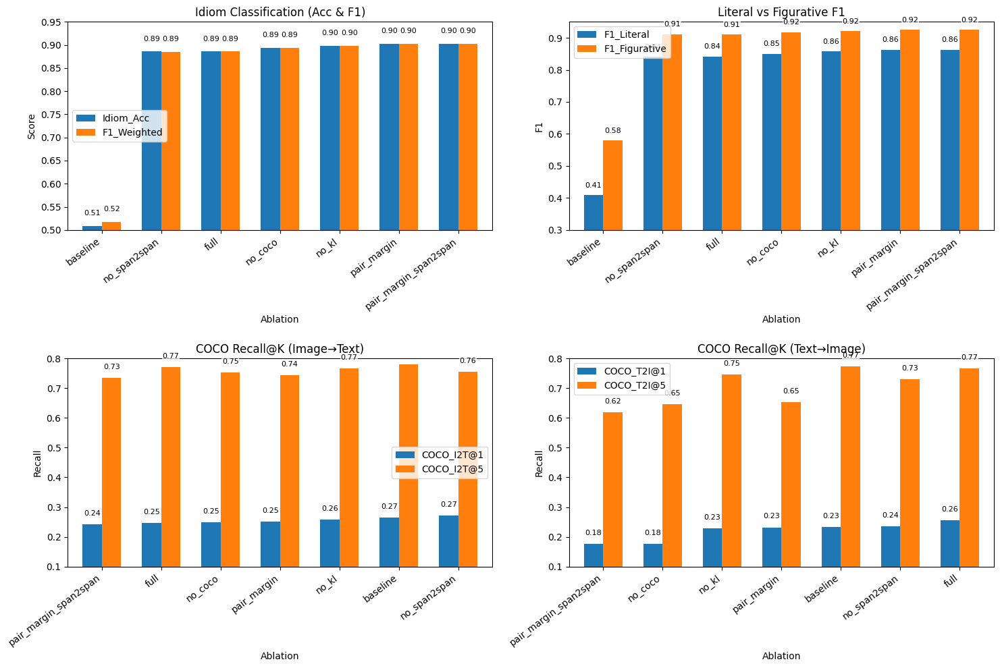

In [11]:
ckpt = hf_hub_download("apple/MobileCLIP-S0", "mobileclip_s0.pt")

ablation_settings = [
    dict(name="baseline", lambda_supcon=0.0, lmbd_kl=0.1, lambda_retrieval=1.0, coco_loss_prob=0.1, pair_margin=0.2,lmbd_pair=2.0),
    dict(name="pair_margin", lambda_supcon=0.0, lmbd_kl=0.0, lambda_retrieval=0.0, coco_loss_prob=0.0, pair_margin=0.2,lmbd_pair=2.0),
    dict(name="pair_margin_span2span", lambda_supcon=0.5, lmbd_kl=0.0, lambda_retrieval=0.0, coco_loss_prob=0.0, pair_margin=0.2,lmbd_pair=2.0),
    dict(name="no_kl", lambda_supcon=0.5, lmbd_kl=0.0, lambda_retrieval=1.0, coco_loss_prob=0.1, pair_margin=0.2,lmbd_pair=2.0),
    dict(name="no_coco", lambda_supcon=0.5, lmbd_kl=0.1, lambda_retrieval=0.0, coco_loss_prob=0.0, pair_margin=0.2,lmbd_pair=2.0),
    dict(name="no_span2span", lambda_supcon=0.0, lmbd_kl=0.1, lambda_retrieval=1.0, coco_loss_prob=0.1, pair_margin=0.2,lmbd_pair=2.0),
    dict(name="full", lambda_supcon=0.5, lmbd_kl=0.1, lambda_retrieval=1.0, coco_loss_prob=0.1, pair_margin=0.2,lmbd_pair=2.0),
]

results = []

for config in ablation_settings:
    print(f"\n==== Ablation: {config['name']} ====")

    # fresh base model each run
    model, _, preprocess = mobileclip.create_model_and_transforms('mobileclip_s0', pretrained=ckpt)

    # fresh data module
    data_module = IdiomDataModule(
        idiom_image_path=idiom_image_path,
        magpie_path=magpie_path,
        coco_parquet_path=coco_parquet_path,
        image_encoder=model,
        preprocess=preprocess,
        tokenizer=tokenizer,
        batch_size=16,
        num_workers=2,
    )
    data_module.setup()
    idiom_loader = data_module.idiom_train_dataloader()
    coco_loader  = data_module.coco_train_dataloader()
    multi_loader = MultiTaskLoader(idiom_loader, coco_loader)

    train_loader = idiom_loader if (config['lambda_retrieval'] == 0.0 and config['coco_loss_prob'] == 0.0) else multi_loader

    pl_model = MobileCLIPIdiomsLightning(
        model=model,
        tokenizer=tokenizer,
        preprocess=preprocess,
        idiom2img_emb=data_module.idiom2img_embedding,
        train_df=data_module.train_dataframe,
        test_df=data_module.test_dataframe,
        coco_val_sample=data_module.coco_val_sample,
        lambda_supcon=config['lambda_supcon'],
        lmbd_kl=config['lmbd_kl'],
        lambda_retrieval=config['lambda_retrieval'],
        coco_loss_prob=config['coco_loss_prob'],
        pair_margin=config['pair_margin'],
        lmbd_pair=config['lmbd_pair'],
    )

    if config['name'] == 'baseline':
        # Evaluate pretrained (no fine-tuning)
        m = pl_model.eval_lit_fig()
        i2t_recall, t2i_recall = pl_model.eval_coco_retrieval(*data_module.coco_val_sample, return_dicts=True)
        model_for_report = pl_model
    else:
        # Checkpoint on epoch-aggregated TRAINING loss (not validation)
        checkpoint_callback = ModelCheckpoint(
            save_top_k=1,
            monitor="train_loss",  # <-- from training_step with on_epoch=True
            mode="min",
            every_n_epochs=1,
        )

        trainer = pl.Trainer(
            max_epochs=10,
            accelerator="auto",
            devices=1,
            num_sanity_val_steps=0,
            log_every_n_steps=50,
            precision="16-mixed",
            callbacks=[checkpoint_callback],
            logger=False,
        )

        trainer.fit(
            pl_model,
            train_dataloaders=train_loader,
            val_dataloaders=data_module.idiom_val_dataloader()
        )

        best_ckpt = checkpoint_callback.best_model_path
        assert best_ckpt, "No checkpoint was saved. Ensure 'train_loss' is logged with on_epoch=True."

        pl_model_trained = MobileCLIPIdiomsLightning.load_from_checkpoint(
            best_ckpt,
            model=model,
            tokenizer=tokenizer,
            preprocess=preprocess,
            idiom2img_emb=data_module.idiom2img_embedding,
            train_df=data_module.train_dataframe,
            test_df=data_module.test_dataframe,
            coco_val_sample=data_module.coco_val_sample,
        ).eval().to("cuda" if torch.cuda.is_available() else "cpu")

        m = pl_model_trained.eval_lit_fig()
        i2t_recall, t2i_recall = pl_model_trained.eval_coco_retrieval(*data_module.coco_val_sample, return_dicts=True)


    results.append({
          'Ablation': config['name'],
          'Idiom_Acc': m['Idiom_Acc'],
          'F1_Literal': m['F1_Literal'],
          'F1_Figurative': m['F1_Figurative'],
          'F1_Weighted': m['F1_Weighted'],
          'COCO_I2T@1': i2t_recall[1],
          'COCO_I2T@5': i2t_recall[5],
          'COCO_T2I@1': t2i_recall[1],
          'COCO_T2I@5': t2i_recall[5],
    })



# ---- Display results ----
df = pd.DataFrame(results)
display(df)

import matplotlib.pyplot as plt

def plot_ablation_sorted_by_metric(df):
    fig, axs = plt.subplots(2, 2, figsize=(15, 10))

    subplot_configs = [
        (['Idiom_Acc', 'F1_Weighted'], axs[0,0], 'Idiom Classification (Acc & F1)', 'Score', (0.5, 0.95), 0.02),
        (['F1_Literal', 'F1_Figurative'], axs[0,1], 'Literal vs Figurative F1', 'F1', (0.3, 0.95), 0.02),
        (['COCO_I2T@1', 'COCO_I2T@5'], axs[1,0], 'COCO Recall@K (Image→Text)', 'Recall', (0.1, 0.8), 0.025),
        (['COCO_T2I@1', 'COCO_T2I@5'], axs[1,1], 'COCO Recall@K (Text→Image)', 'Recall', (0.1, 0.8), 0.025)
    ]

    for metrics, ax, title, ylab, ylim, annot_shift in subplot_configs:
        # Sort the df by the first metric for each subplot
        order = df.sort_values(metrics[0])[ 'Ablation' ]
        df_ordered = df.set_index('Ablation').loc[order].reset_index()

        df_ordered.set_index('Ablation')[metrics].plot.bar(ax=ax, width=0.65)
        ax.set_title(title)
        ax.set_ylabel(ylab)
        ax.set_ylim(*ylim)
        ax.set_xticklabels(df_ordered['Ablation'], rotation=37, ha='right', fontsize=10)
        # Annotate each bar
        for p in ax.patches:
            ax.annotate(f'{p.get_height():.2f}',
                        (p.get_x() + p.get_width() / 2, p.get_height() + annot_shift),
                        ha='center', va='bottom', fontsize=8,
                        bbox=dict(facecolor='white', alpha=0.75, edgecolor='none', pad=0.5))

    plt.tight_layout(h_pad=2)
    plt.show()

# Usage:
plot_ablation_sorted_by_metric(df)


## Conclusions

- Adding images for idiomatic disambiguation sharply improves performance, raising idiom accuracy from 0.51 (baseline) to 0.89 - 0.90 and weighted F1 from 0.52 to 0.89+.

- The Span-to-image alignment with the pairwise margin loss was the main driver, with figurative F1 0.92, and Literal F1 0.86. Adding the span-to-span supervised contrastive learning resulted in the same F1 values, but causes the retrieval to drop. KL regularization had little effect.

- For COCO retrieval, the
pretrained baseline achieved the best Recall@5 (≈0.77–0.78), whereas fine-tuned models were slightly lower (≈0.71–0.76). The auxiliary COCO loss helped preserve and in some cases even improve alignment over the baseline. removal of the auxiliary COCO loss caused retrieval drop, confirming its role in preventing multimodal forgetting.

- Auxiliary COCO retrieval prevents overfitting to idiom-specific data and enhances general image-text alignment.


## Next Steps

The model excels at idiomatic disambiguation, especially for figurative cases, but can further improve literal idiom recognition and the balance between idiom and retrieval performance. Key next steps include optimizing multitask trade-offs, enhancing image representations, and performing targeted error analysis to address current weaknesses.

1. **Larger-Scale Evaluation:**
This training was done on only 35 Idioms and ~900 sentences. Train and evaluate on larger, more diverse idiom datasets for better generalization.

2. **Hyper Optimization and Multitask Trade-off:**
Experiment with dynamic loss weighting using Optuna to balance idiom and retrieval tasks.

3. **Literal Idiom Recognition:**
Use data augmentation and error analysis to improve literal idiom F1.

4. **Qualitative/Error Analysis:**
Conduct in-depth analysis of mistakes and decision boundaries to guide improvements.

5. **COCO Signal Utilization:**
Explore advanced joint learning or pseudo-labeling to boost retrieval impact.

6. **Image Representation:**
Fine-tune image encoder or try richer visual features for better retrieval results.

7. **Robustness Testing:**
Test model robustness to adversarial examples, ambiguous idioms, or out-of-domain data.

8. **Interpretability & Explainability**:
Develop visualizations (e.g., attention maps, embedding plots) to understand model decisions.

9. **Span Alignment Loss**:
Test alternative alignment losses (e.g., triplet loss) for better idiom generalization. Our current losses (contrastive, cross-entropy, and KL-divergence) are strong for idiom-image alignment and regularization, but alternative losses like triplet, center, and angular margin losses could further enhance clustering, class separation, or robustness. Exploring these losses may address class imbalance, improve embedding space structure, and boost performance on challenging or diverse datasets.

| Loss Type                   | Example Losses                       | What They Help With                                                  | When to Try                                      |
|-----------------------------|--------------------------------------|---------------------------------------------------------------------|--------------------------------------------------|
| Contrastive                 | Triplet, Multi-Similarity            | Fine-grained alignment, improved retrieval/clustering               | When retrieval/clustering is suboptimal          |
| Classification Margin       | ArcFace, Angular Margin, Focal       | Stronger class boundaries, handling class imbalance                 | If classes are imbalanced or poorly separated    |
| Clustering/Regularization   | Center Loss                          | Tight intra-class grouping of embeddings                            | When intra-class variance is high                |
| Consistency/Alignment       | Alignment Consistency, KL            | Robustness across modalities, cross-modal agreement                 | When multimodal agreement is weak                |
| Sequence Prediction         | Contrastive Predictive Coding (CPC)  | Contextual or sequential dependencies                               | For context-sensitive or sequence tasks          |
| Adversarial                | Adversarial (GAN-style)              | Domain-invariant, robust multimodal embeddings                      | For domain adaptation, cross-domain tasks        |


10. **Cross-Model Comparison:**
Benchmark against other multimodal models or architectures for idiom and retrieval tasks.

11. **Continual Learning:**
Investigate how the model adapts or degrades with incremental exposure to new idioms or images.

12. **Explore Joint Training with Multi Modal Word Sense Disambiguation Datasets:** WSD based on works like PolCLIP: A Unified Image‑Text Word Sense Disambiguation Model (ACL 2024) to furthur improve the semantic disambiguation capability of the MobileClip model

13. **Explore the robustness and generalizability:** of the approach on multilingual and multicultural idioms, especially those without direct visual or literal translation, by curating and evaluating on culturally diverse datasets.


# Appendix

## Training Lora

In [ ]:
# # ========== 1. Reload Model ==========

# print("Loading Model:" )

# # Download the pretrained MobileCLIP checkpoint from the HuggingFace Hub
# ckpt = hf_hub_download("apple/MobileCLIP-S0", "mobileclip_s0.pt")

# # Load the MobileCLIP model, along with its image preprocessing function
# model, _, preprocess = mobileclip.create_model_and_transforms(
#     'mobileclip_s0',
#     pretrained=ckpt
# )

# # Load the associated tokenizer for MobileCLIP
# tokenizer = mobileclip.get_tokenizer('mobileclip_s0')


# # ========== 2. Apply LoRA and train ==========

# # 1. Set up the LoRA configuration for typical CLIP-like transformer modules
# lora_config = LoraConfig(
#     r=8,                                     # LoRA rank (bottleneck size)
#     lora_alpha=16,                           # LoRA scaling factor
#     target_modules=["qkv_proj", "out_proj", "fc1", "fc2"],  # Modules to inject LoRA into
#     lora_dropout=0.05,                       # Dropout on LoRA layers
#     bias="none",                             # Do not add extra bias params
#     task_type="FEATURE_EXTRACTION",          # Task type for CLIP/vision models
# )

# # 2. Inject LoRA adapters into the text encoder (weights are now LoRA-enabled)
# model.text_encoder = get_peft_model(model.text_encoder, lora_config)

# # 3. Freeze all non-LoRA parameters, only LoRA parameters are trainable
# for name, param in model.text_encoder.named_parameters():
#     param.requires_grad = "lora" in name.lower()

# # 4. Optionally print names and shapes of trainable parameters (for debugging)
# print("Trainable parameters (LoRA only):")
# for name, param in model.text_encoder.named_parameters():
#     if param.requires_grad:
#         print(name, param.shape)


# # ========== 3. Lightning Model with LoRA ==========

# # Initialize the LightningModule with LoRA-injected model and all required data
# pl_model = MobileCLIPIdiomsLightning(
#     model=model,
#     tokenizer=tokenizer,
#     preprocess=preprocess,
#     idiom2img_emb=data_module.idiom2img_embedding,
#     train_df=data_module.train_dataframe,
#     test_df=data_module.test_dataframe,
#     coco_val_sample=data_module.coco_val_sample,
#     lambda_retrieval=1.0,    # Weight for COCO retrieval loss
#     coco_loss_prob=0.1,      # 10% of batches include COCO retrieval loss
# )

# # ========== 4. Training Loop ==========

# print("Training:" )

# # Create a profiler for measuring training performance
# profiler = pl.profilers.SimpleProfiler()

# # Create a checkpoint callback to save the best model every 5 epochs
# checkpoint_callback = ModelCheckpoint(
#     save_top_k=1,           # Only keep the best checkpoint
#     monitor="loss",         # Monitor training loss for saving
#     every_n_epochs=5,       # Save a checkpoint every 5 epochs
# )

# # Configure the PyTorch Lightning Trainer for the experiment
# trainer = pl.Trainer(
#     max_epochs=30,                                 # Train for 30 epochs
#     profiler=profiler,                             # Use simple profiler
#     accelerator="auto",                            # Use GPU if available
#     devices=1,                                     # Number of devices (GPUs/CPUs)
#     num_sanity_val_steps=0,                        # Skip sanity validation steps
#     log_every_n_steps=50,                          # Log metrics every 50 steps
#     precision="16-mixed",                          # Use mixed precision if supported
#     callbacks=[checkpoint_callback]                # Add checkpoint saving
# )

# # Start training with multitask loader and validation loader
# trainer.fit(
#     pl_model,
#     train_dataloaders=multi_loader,                       # Multitask training batches
#     val_dataloaders=data_module.idiom_val_dataloader()    # Validation batches
# )

# # Print a summary of profiler statistics at the end of training
# print(profiler.summary())
